# Heating Process

## Energy Balances
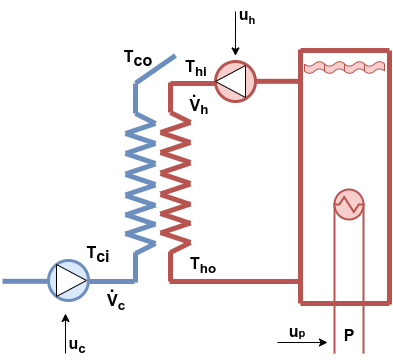



In [1]:
import torch
import platform
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch.nn as nn

## Colab

In [2]:
# from google.colab import files
# files.upload()

## Loading data

In [3]:
if platform.system() == 'Windows':
    !dir
else:
    !ls

BPNN_model.pth                      best_model.pth
Bild PBNN.pptx                      best_model_pv.pth
FNNR_model.pth                      figures
Heat_Process_Model_Final V1.ipynb   multSineExp 1.csv
Heat_Process_Testing_Final V1.ipynb paper.log
Heat_Process_Variables_Final.ipynb  paper.pdf
PBN_model.pth                       paper.synctex.gz
PRBS.csv                            paper.tex
STE2025.zip                         references.bib
Structured-abstact.pdf              splncs03.bst
Structured-abstract.docx            svproc.cls


In [4]:
# Reading the data
df = pd.read_csv('multSineExp 1.csv')
#df = pd.read_csv('PRBS.csv', delimiter=";")
df.head()

,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,129.46,2.4426,0.002443,21.031,22.789,18.539,22.570,1.0,1.0,100.0
1,129.34,2.4426,0.839030,21.251,22.789,18.466,22.423,2.0,2.0,100.0
2,129.34,2.4426,1.309200,21.251,22.863,18.539,22.350,3.0,3.0,100.0
3,129.46,2.4426,1.493600,21.104,22.863,18.466,22.423,4.0,4.0,100.0
4,129.46,2.4426,1.563300,21.104,22.863,18.466,22.350,5.0,5.0,100.0


In [5]:
df.columns = ['L_in', 'V_c [ml/min]', 'P [kW]', 'T_ho [°C]', 'T_hi [°C]', 'T_ci [°C]', 'T_co [°C]', 'u_c [%]', 'u_h [%]', 'u_p [%]']

In [6]:
df.describe()

,L_in,V_c [ml/min],P [kW],T_ho [°C],T_hi [°C],T_ci [°C],T_co [°C],u_c [%],u_h [%],u_p [%]
count,14399.000000,14399.000000,14399.000000,14399.000000,14399.000000,14399.000000,14399.000000,14399.000000,14399.000000,14399.000000
mean,58.138551,70.341802,0.177771,17.632022,22.926695,7.188254,18.689331,29.398230,29.263161,10.589990
std,64.289885,81.023049,0.224078,17.735320,23.042609,7.219455,18.810275,31.850613,31.767073,14.047084
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,117.490000,139.350000,0.337080,35.467000,46.019000,14.362000,37.738000,60.000000,60.000000,20.000000
max,183.560000,500.000000,1.604800,40.669000,52.687000,19.932000,43.381000,100.000000,100.000000,100.000000


<Axes: >

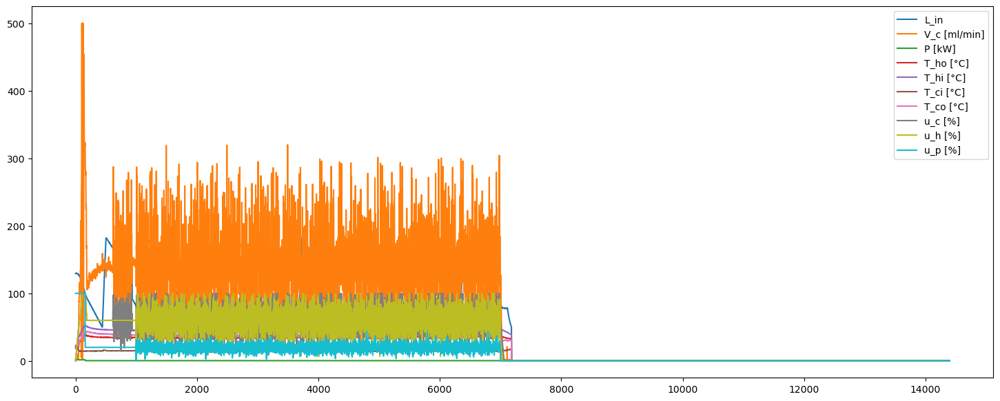

In [7]:
df.plot(figsize = [18,7])

In [8]:
start = 995
end = 6995 
df = df[start:end]

In [9]:
df = df.reset_index(drop=True)

<Axes: >

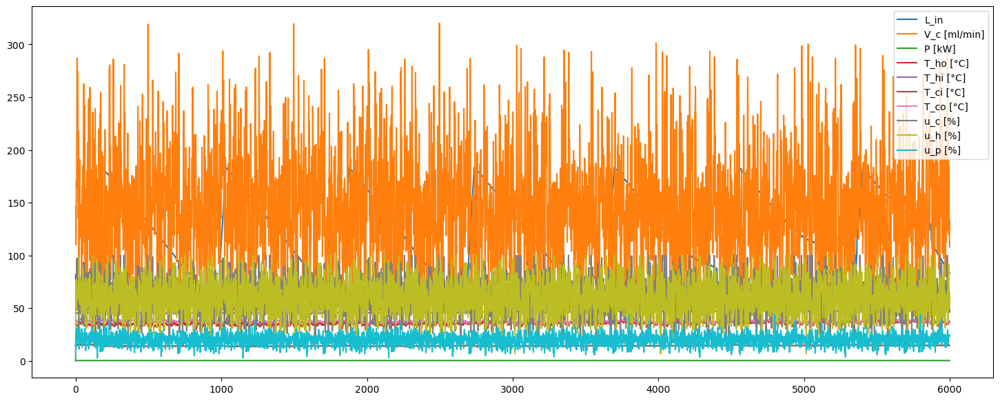

In [10]:
df.plot(figsize = [18,7])

<Axes: >

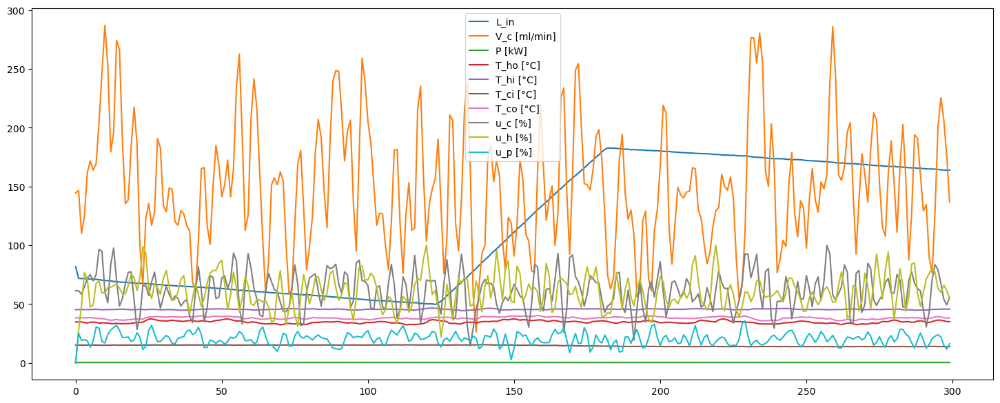

In [11]:
df[0:300].plot(figsize = [18,7])

<Axes: >

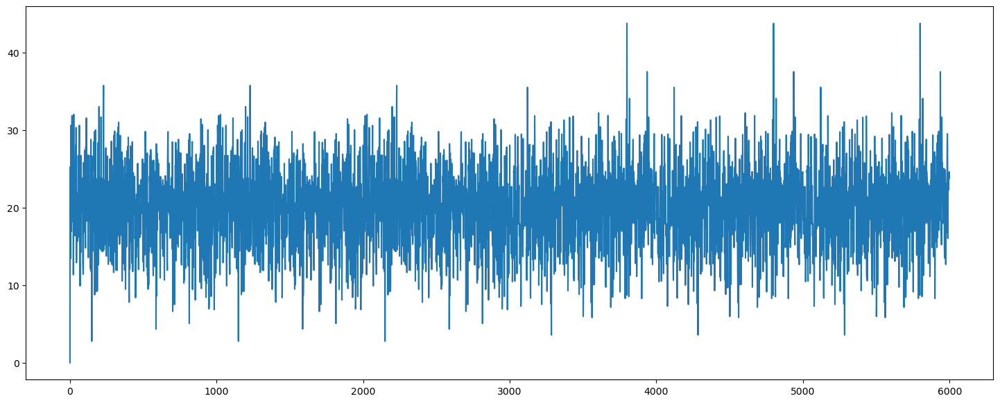

In [12]:
df['u_p [%]'].plot(figsize = [18,7])

<Axes: >

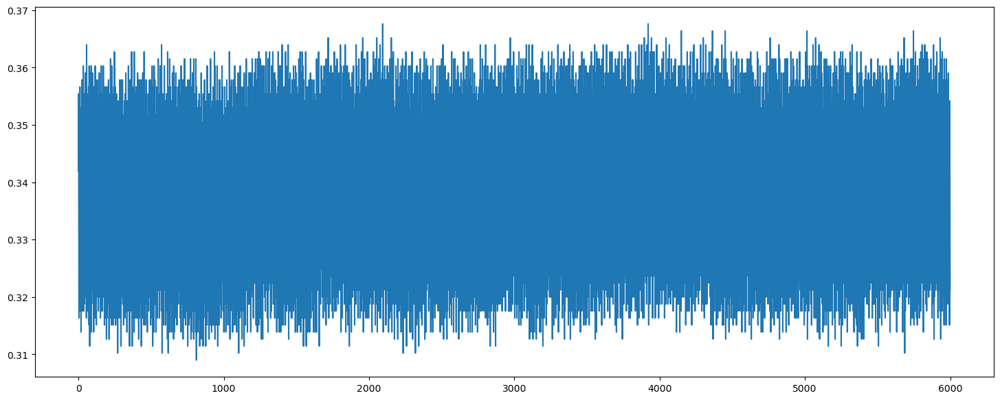

In [13]:
df['P [kW]'].plot(figsize = [18,7])

<Axes: >

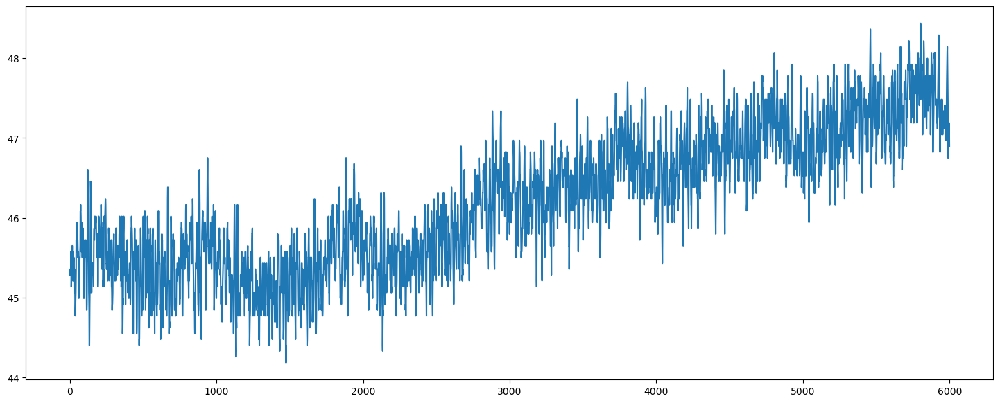

In [14]:
df['T_hi [°C]'].plot(figsize = [18,7])

<Axes: >

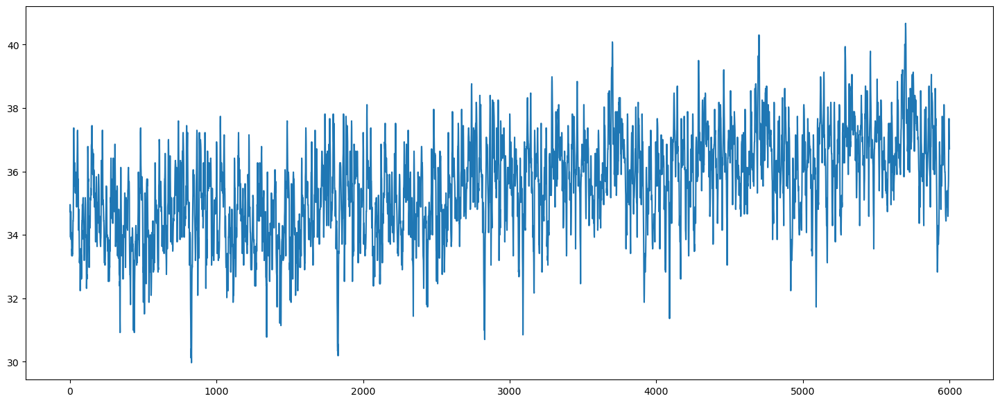

In [15]:
df['T_ho [°C]'].plot(figsize = [18,7])

<Axes: >

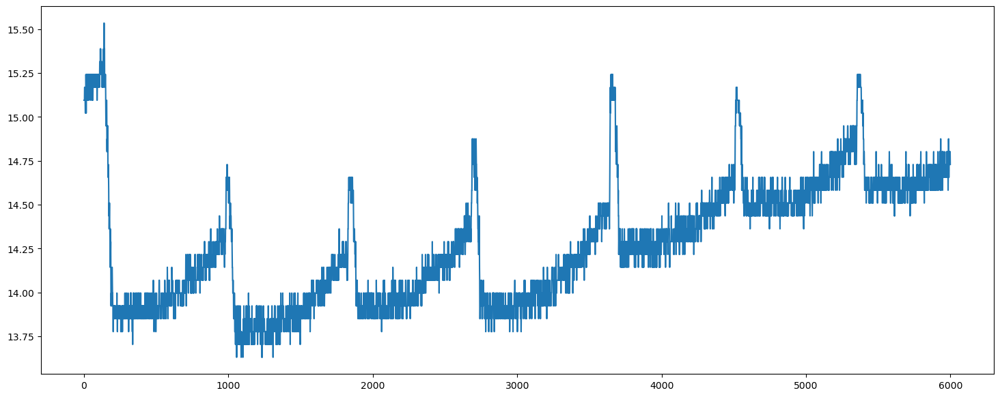

In [16]:
df['T_ci [°C]'].plot(figsize = [18,7])

<Axes: >

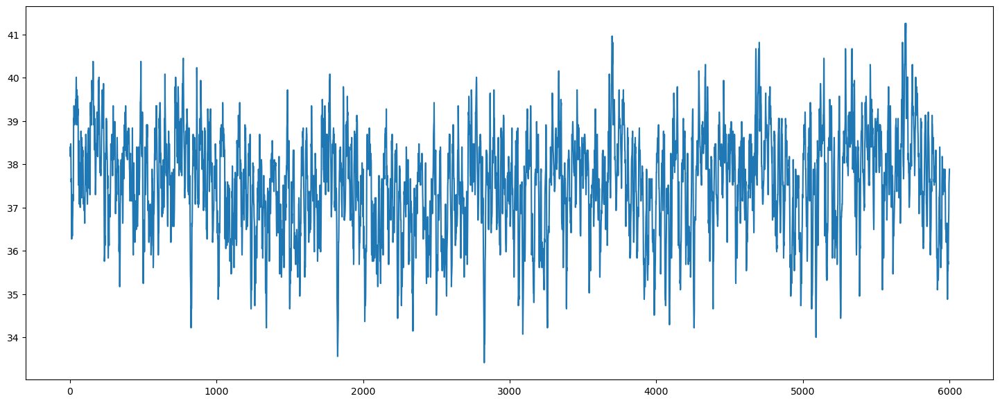

In [17]:
df['T_co [°C]'].plot(figsize = [18,7])

## Creating shifted variables

In [18]:
df['T_ho_k+1 [°C]'] = df['T_ho [°C]'].shift(-1)
df['T_hi_k+1 [°C]'] = df['T_hi [°C]'].shift(-1)
df['T_co_k+1 [°C]'] = df['T_co [°C]'].shift(-1)

In [19]:
df = df.ffill()
df = df.bfill()

df

,L_in,V_c [ml/min],P [kW],T_ho [°C],T_hi [°C],T_ci [°C],T_co [°C],u_c [%],u_h [%],u_p [%],T_ho_k+1 [°C],T_hi_k+1 [°C],T_co_k+1 [°C]
0,81.827,144.60,0.34196,34.734,45.286,15.095,38.324,61.356,0.000,0.000,34.954,45.286,38.324
1,71.935,146.56,0.35540,34.954,45.286,15.095,38.324,61.356,27.601,25.246,34.807,45.359,38.398
2,71.690,110.16,0.34319,34.807,45.359,15.095,38.398,58.376,48.743,19.052,34.294,45.359,38.178
3,71.690,125.06,0.32853,34.294,45.359,15.095,38.178,64.621,76.985,19.805,33.928,45.359,38.398
4,71.446,161.94,0.31632,33.928,45.359,15.169,38.398,72.056,70.952,18.715,34.514,45.286,38.471
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,84.270,148.51,0.31510,37.518,47.118,14.802,36.932,66.723,53.595,24.199,37.665,47.191,37.518
5996,83.903,123.84,0.35418,37.665,47.191,14.729,37.518,60.282,50.300,24.361,37.298,47.191,37.665
5997,83.659,133.37,0.34807,37.298,47.191,14.802,37.665,46.012,56.951,24.407,36.859,47.118,37.811
5998,83.659,116.02,0.33464,36.859,47.118,14.802,37.811,46.072,64.038,24.623,36.712,46.898,37.885


## Create variables

In [20]:
df['P_est [kW]'] = float('nan')
df['V_c_est [ml/min]'] = float('nan')
df['V_h_est [ml/min]'] = float('nan')
df['T_hi_est [°C]'] = float('nan')
df['T_ho_est [°C]'] = float('nan')
df['T_co_est [°C]'] = float('nan')

df.at[0, 'P_est [kW]'] = df.at[0, 'P [kW]']
df.at[0, 'V_c_est [ml/min]'] = df.at[0, 'V_c [ml/min]']
df.at[0, 'V_h_est [ml/min]'] = 300.0
df.at[0, 'T_hi_est [°C]'] = df.at[0, 'T_hi [°C]']
df.at[0, 'T_ho_est [°C]'] = df.at[0, 'T_ho [°C]']
df.at[0, 'T_co_est [°C]'] = df.at[0, 'T_co [°C]']

In [21]:
len(df)

6000

## Device, features and targets

In [22]:
# Device
if torch.backends.mps.is_available():
    device ='mps'
else:
  device = 'cpu'
device

'mps'

In [23]:
features = ['u_p [%]', 'P_est [kW]', 
            'u_c [%]', 'V_c_est [ml/min]', 
            'u_h [%]', 'V_h_est [ml/min]', 
            'T_hi_est [°C]', 'T_ho_est [°C]', 'T_ci [°C]', 'T_co_est [°C]']#'T_hi [°C]', 'T_ho_est [°C]', 'T_ci [°C]', 'T_co_est [°C]']
targets = ['P_est [kW]', 'V_c_est [ml/min]', 'V_h_est [ml/min]', 
           'T_hi_est [°C]','T_ho_est [°C]','T_co_est [°C]']

## Dataset

In [24]:
# Dataset
from torch.utils.data import Dataset
class MyDataset(Dataset):

  def __init__(self,df,features, targets):
    self.X=torch.tensor(df[features].values, dtype=torch.float32)
    self.y=torch.tensor(df[targets].values,dtype=torch.float32)

  def __len__(self):
    return len(self.y)

  def __getitem__(self,idx):
    return self.X[idx], self.y[idx]

## Models

In [25]:
# model for the neural network
class NNModel(torch.nn.Module):
    def __init__(self, drop):
        super(NNModel, self).__init__()
        self.linear1 = torch.nn.Linear(10, 16)
        self.linear2 = torch.nn.Linear(16, 8)
        self.linear3 = torch.nn.Linear(8, 3)
        self.activation = torch.nn.ReLU()
        #self.bn1 = nn.BatchNorm1d(10)
        #self.bn2 = nn.BatchNorm1d(16)
        #self.bn3 = nn.BatchNorm1d(8)
        self.dropout1 = nn.Dropout(p = drop)
        self.dropout2 = nn.Dropout(p = drop)

    def forward(self, x):
        #x = self.bn1(x)
        x = self.linear1(x)
        x = self.dropout1(x)
        x = self.activation(x)

        #x = self.bn2(x)
        x = self.linear2(x)
        x = self.dropout2(x)
        x = self.activation(x)

        #x = self.bn3(x)
        x = self.linear3(x) # 
        return x

In [26]:
# model for process variables 
class ProcessVariableModel(torch.nn.Module):
    def __init__(self, K, T, Ts, u_min):
        super(ProcessVariableModel, self).__init__()
        self.K = K
        self.T = T
        self.Ts = Ts
        #self.u_min = u_min
        self.u_min = torch.tensor(u_min)
    
    def forward(self, x):
        # x = self.Ts*self.K/self.T*torch.relu(x[:,0]-self.u_min) + (1-self.Ts/self.T)*x[:,1]
        x = self.Ts*self.K/self.T*torch.max(x[:,0]-self.u_min, torch.tensor(0.0)) + (1-self.Ts/self.T)*x[:,1]
        return x

In [27]:
# model for physics-based variables
class PhysicsModel(torch.nn.Module):
    def __init__(self):
        super(PhysicsModel, self).__init__()

        self.c_hi1 = torch.nn.Parameter(torch.rand(1,1))
        self.c_hi2 = torch.nn.Parameter(torch.rand(1,1))
        self.c_hi3 = torch.nn.Parameter(torch.rand(1,1))
        self.c_hi4 = torch.nn.Parameter(torch.rand(1,1))
  
        self.c_ho1 = torch.nn.Parameter(torch.rand(1,1))
        self.c_ho2 = torch.nn.Parameter(torch.rand(1,1))
        self.c_ho3 = torch.nn.Parameter(torch.rand(1,1))

        self.c_co1 = torch.nn.Parameter(torch.rand(1,1))
        self.c_co2 = torch.nn.Parameter(torch.rand(1,1))
    
    def forward(self, x):
        # ['P_est [kW]', 'V_c_est [ml/min]', 'V_h_est [ml/min]', 'T_hi [°C]','T_ho [°C]','T_ci [°C]','T_co [°C]']
        P = x[:,0]
        V_c = x[:,1] 
        V_h = x[:,2] 
        T_hi = x[:,3]
        T_ho = x[:,4]
        T_ci = x[:,5]
        T_co = x[:,6]
        
        # Eq. (6)
        delta_T_1 = T_hi - T_co
        delta_T_2 = T_ho - T_ci
        delta_T_lm = (delta_T_2 + delta_T_1)/2.0 
        # delta_T_lm = (delta_T_2 - delta_T_1) / (torch.log(delta_T_2)-torch.log(delta_T_1))

        # Eq. (12) except the residual part of the equation
        T_hi_k1 = self.c_hi1*P + self.c_hi2*V_h*(T_hi - T_ho) + self.c_hi3*(T_hi - self.c_hi4) 
        
        # Eq. (13) except the residual part of the equation
        T_ho_k1 = self.c_ho1*V_h*(T_hi - T_ho) + self.c_ho2*delta_T_lm + self.c_ho3*(T_hi - self.c_hi4) 
        
        # Eq. (14) except the residual part of the equation
        T_co_k1 = self.c_co1*V_c*(T_ci - T_co) + self.c_co2*delta_T_lm 
        
        x = torch.cat((T_hi_k1, T_ho_k1, T_co_k1), 0)
        x = x.transpose(0, 1)
        return x

In [28]:
# model for physics-based variables
class ResidualModel(torch.nn.Module):
    def __init__(self):
        super(ResidualModel, self).__init__()

    def forward(self, x):
        return x

In [29]:
bias_1 = 0.0
bias_2 = 0.0
bias_3 = 0.0

In [30]:
# total model
class FNNRModel(torch.nn.Module):
    def __init__(self, drop_out):
        super(FNNRModel, self).__init__()
        self.residual_model = ResidualModel()
        self.NN_model = NNModel(drop = drop_out)
        self.P_model = ProcessVariableModel(K = 0.016448197219320244, T = 1.6774198321721923, Ts = 1.0, u_min = 0.0)
        self.V_h_model = ProcessVariableModel(K = 10.0, T = 1.0, Ts = 1.0, u_min = 19.0)
        self.V_c_model = ProcessVariableModel(K = 4.542787080789755, T = 2.3955179532313875, Ts = 1.0, u_min = 20.35188865661621)

    def forward(self, x):
        # ['u_p [%]', 'P_est [kW]',  'u_c [%]', 'V_c_est [ml/min]', 'u_h [%]', 'V_h_est [ml/min]', 'T_hi [°C]', 'T_ho [°C]', 'T_ci [°C]','T_co [°C]']        
        x_residual = x[:,[6,7,9]]
        x_NN = x
        x_P =  x[:,[0,1]]
        x_V_h = x[:,[4,5]]
        x_V_c = x[:,[2,3]]
        
        x_residual = self.residual_model(x_residual)
        x_NN = self.NN_model(x_NN)
        x_P = self.P_model(x_P) 
        x_V_h = self.V_h_model(x_V_h) 
        x_V_c = self.V_c_model(x_V_c) 
        
        T_hi_k1 = x_NN[:,0] + x_residual[:,0] + bias_1
        T_ho_k1 = x_NN[:,1] + x_residual[:,1] + bias_2
        T_co_k1 = x_NN[:,2] + x_residual[:,2] + bias_3
        
        #['P_est_k+1 [kW]', 'V_c_est_k+1 [ml/min]', 'V_h_est_k+1 [ml/min]', 'T_hi_k+1 [°C]','T_ho_k+1 [°C]','T_co_k+1 [°C]']
        x = torch.stack((x_P, x_V_c, x_V_h, T_hi_k1, T_ho_k1, T_co_k1), dim=1)
        
        return x

In [31]:
# total model
class PBNModel(torch.nn.Module):
    def __init__(self):
        super(PBNModel, self).__init__()
        self.residual_model = ResidualModel()
        self.P_model = ProcessVariableModel(K = 0.016448197219320244, T = 1.6774198321721923, Ts = 1.0, u_min = 0.0)
        self.V_h_model = ProcessVariableModel(K = 10.0, T = 1.0, Ts = 1.0, u_min = 19.0)
        self.V_c_model = ProcessVariableModel(K = 4.542787080789755, T = 2.3955179532313875, Ts = 1.0, u_min = 20.35188865661621)
        self.physics_model = PhysicsModel()
                
    def forward(self, x):
        # ['u_p [%]', 'P_est [kW]',  'u_c [%]', 'V_c_est [ml/min]', 'u_h [%]', 'V_h_est [ml/min]', 'T_hi [°C]', 'T_ho [°C]', 'T_ci [°C]','T_co [°C]']        
        x_residual = x[:,[6,7,9]]
        x_P =  x[:,[0,1]]
        x_V_h = x[:,[4,5]]
        x_V_c = x[:,[2,3]]
        x_physics = x[:,[1,3,5,6,7,8,9]]
        
        x_residual = self.residual_model(x_residual)
        x_P = self.P_model(x_P) 
        x_V_h = self.V_h_model(x_V_h) 
        x_V_c = self.V_c_model(x_V_c) 
        x_physics = self.physics_model(x_physics)
        
        T_hi_k1 = x_physics[:,0] + x_residual[:,0] + bias_1
        T_ho_k1 = x_physics[:,1] + x_residual[:,1] + bias_2
        T_co_k1 = x_physics[:,2] + x_residual[:,2] + bias_3

        #['P_est_k+1 [kW]', 'V_c_est_k+1 [ml/min]', 'V_h_est_k+1 [ml/min]', 'T_hi_k+1 [°C]','T_ho_k+1 [°C]','T_co_k+1 [°C]']
        x = torch.stack((x_P, x_V_c, x_V_h, T_hi_k1, T_ho_k1, T_co_k1), dim=1)

        return x

In [32]:
# total model
class PBNNModel(torch.nn.Module):
    def __init__(self, drop_out):
        super(PBNNModel, self).__init__()
        self.residual_model = ResidualModel()
        self.NN_model = NNModel(drop = drop_out)
        self.P_model = ProcessVariableModel(K = 0.016448197219320244, T = 1.6774198321721923, Ts = 1.0, u_min = 0.0)#T = 1.6774198321721923, Ts = 1.0, u_min = 0.0)
        self.V_h_model = ProcessVariableModel(K = 10.0, T = 1.0, Ts = 1.0, u_min = 19.0)
        self.V_c_model = ProcessVariableModel(K = 4.542787080789755, T = 2.3955179532313875, Ts = 1.0, u_min = 20.35188865661621)
        self.physics_model = PhysicsModel()

    def forward(self, x):
        # ['u_p [%]', 'P_est [kW]',  'u_c [%]', 'V_c_est [ml/min]', 'u_h [%]', 'V_h_est [ml/min]', 'T_hi [°C]', 'T_ho [°C]', 'T_ci [°C]','T_co [°C]']        
        x_residual = x[:,[6,7,9]]
        x_NN = x
        x_P =  x[:,[0,1]]
        x_V_h = x[:,[4,5]]
        x_V_c = x[:,[2,3]]
        x_physics = x[:,[1,3,5,6,7,8,9]]
        
        x_residual = self.residual_model(x_residual)
        x_NN = self.NN_model(x_NN)
        x_P = self.P_model(x_P)  
        x_V_h = self.V_h_model(x_V_h) 
        x_V_c = self.V_c_model(x_V_c) 
        x_physics = self.physics_model(x_physics)
        
        T_hi_k1 = x_NN[:,0] + x_physics[:,0] + x_residual[:,0] + bias_1
        T_ho_k1 = x_NN[:,1] + x_physics[:,1] + x_residual[:,1] + bias_2
        T_co_k1 = x_NN[:,2] + x_physics[:,2] + x_residual[:,2] + bias_3
        
        #['P_est_k+1 [kW]', 'V_c_est_k+1 [ml/min]', 'V_h_est_k+1 [ml/min]', 'T_hi_k+1 [°C]','T_ho_k+1 [°C]','T_co_k+1 [°C]']
        x = torch.stack((x_P, x_V_c, x_V_h, T_hi_k1, T_ho_k1, T_co_k1), dim=1)
        return x

In [33]:
# Define loss function 
loss_fn = nn.MSELoss()
loss_fn2 = nn.L1Loss()

In [34]:
len(df)

6000

## FNNR

In [35]:
df.head(10)

,L_in,V_c [ml/min],P [kW],T_ho [°C],T_hi [°C],T_ci [°C],T_co [°C],u_c [%],u_h [%],u_p [%],T_ho_k+1 [°C],T_hi_k+1 [°C],T_co_k+1 [°C],P_est [kW],V_c_est [ml/min],V_h_est [ml/min],T_hi_est [°C],T_ho_est [°C],T_co_est [°C]
0,81.827,144.60,0.34196,34.734,45.286,15.095,38.324,61.356,0.000,0.000,34.954,45.286,38.324,0.34196,144.6,300.0,45.286,34.734,38.324
1,71.935,146.56,0.35540,34.954,45.286,15.095,38.324,61.356,27.601,25.246,34.807,45.359,38.398,NaN,NaN,NaN,NaN,NaN,NaN
2,71.690,110.16,0.34319,34.807,45.359,15.095,38.398,58.376,48.743,19.052,34.294,45.359,38.178,NaN,NaN,NaN,NaN,NaN,NaN
3,71.690,125.06,0.32853,34.294,45.359,15.095,38.178,64.621,76.985,19.805,33.928,45.359,38.398,NaN,NaN,NaN,NaN,NaN,NaN
4,71.446,161.94,0.31632,33.928,45.359,15.169,38.398,72.056,70.952,18.715,34.514,45.286,38.471,NaN,NaN,NaN,NaN,NaN,NaN
5,71.324,171.71,0.35051,34.514,45.286,15.169,38.471,75.055,47.543,13.432,34.734,45.506,38.398,NaN,NaN,NaN,NaN,NaN,NaN
6,71.080,163.90,0.35051,34.734,45.506,15.169,38.398,69.772,49.290,18.497,34.514,45.579,37.958,NaN,NaN,NaN,NaN,NaN,NaN
7,70.957,169.27,0.33830,34.514,45.579,15.095,37.958,74.987,67.844,30.612,33.854,45.359,37.592,NaN,NaN,NaN,NaN,NaN,NaN
8,70.713,204.45,0.32487,33.854,45.359,15.095,37.592,96.472,69.346,29.556,34.001,45.139,37.665,NaN,NaN,NaN,NaN,NaN,NaN
9,70.347,246.70,0.33097,34.001,45.139,15.022,37.665,94.916,59.541,18.468,34.074,45.213,37.298,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
# Load model to device
model = FNNRModel(drop_out=0.3).to(device)
model.load_state_dict(torch.load('FNNR_model.pth'))  
model.eval()  

# Loop through each row of the DataFrame
for index in range(len(df)-1):
    # Convert the row to a torch tensor
    input_tensor = torch.tensor(df.loc[index, features].values, dtype=torch.float32)

    # Add batch dimension by unsqueezing
    input_tensor = input_tensor.unsqueeze(0)  # Shape: [1, 10]
    input_tensor = input_tensor.to(device)
    
    # Forward pass through the model
    with torch.no_grad():  # No need to compute gradients
        output = model(input_tensor)

    # Process the output (remove batch dimension)
    output = output.squeeze(0).cpu().numpy()  # Shape: [6] if your model predicts 6 outputs

    # Store the model output in the corresponding columns of the DataFrame
    df.loc[index+1, targets] = output

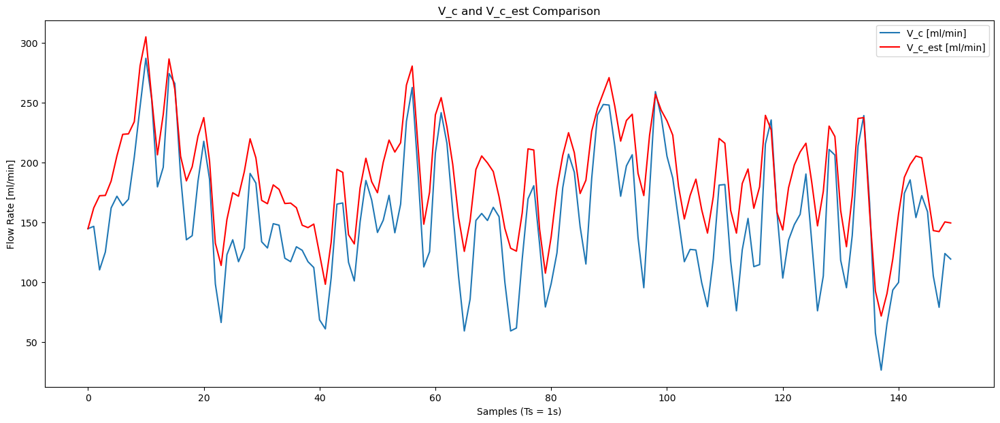

In [37]:
df[:150]['V_c [ml/min]'].plot(legend = 'V_c [ml/min]')
df[:150]['V_c_est [ml/min]'].plot(color = 'red', figsize = [18,7], legend = 'V_c_est [ml/min]')

# Adding labels and legend
plt.title('V_c and V_c_est Comparison')
plt.xlabel('Samples (Ts = 1s)')
plt.ylabel('Flow Rate [ml/min]')

# Display the plot
plt.show()

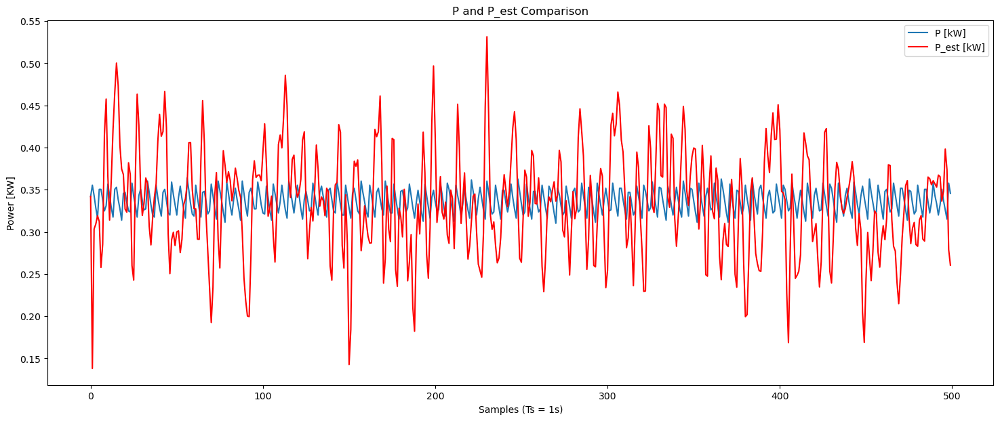

In [38]:
df[:500]['P [kW]'].plot(legend = 'P [kW]')
df[:500]['P_est [kW]'].plot(color = 'red', figsize = [18,7], legend = 'P_est [kW]')

# Adding labels and legend
plt.title('P and P_est Comparison')
plt.xlabel('Samples (Ts = 1s)')
plt.ylabel('Power [KW]')

# Display the plot
plt.show()

In [39]:
df['FNNR T_hi [°C]'] = df['T_hi_est [°C]']
df['FNNR T_ho [°C]'] = df['T_ho_est [°C]']
df['FNNR T_co [°C]'] = df['T_co_est [°C]']

<Axes: >

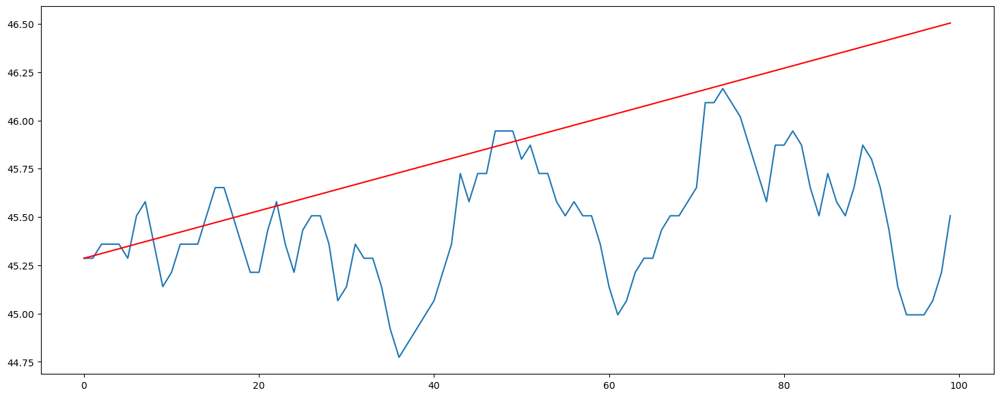

In [40]:
df[0:100]['T_hi [°C]'].plot()
df[0:100]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

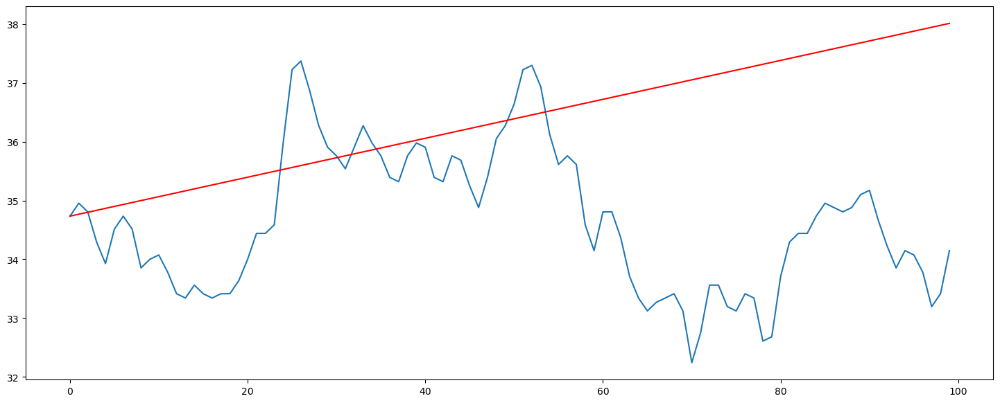

In [41]:
df[0:100]['T_ho [°C]'].plot()
df[0:100]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

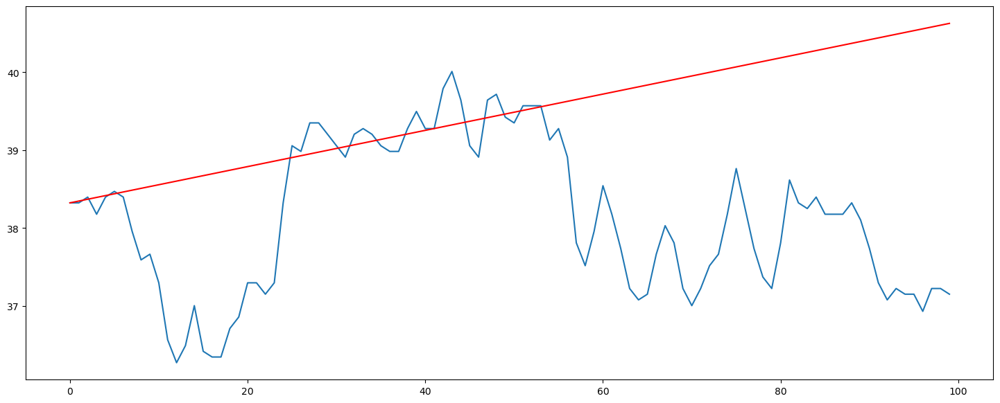

In [42]:
df[0:100]['T_co [°C]'].plot()
df[0:100]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

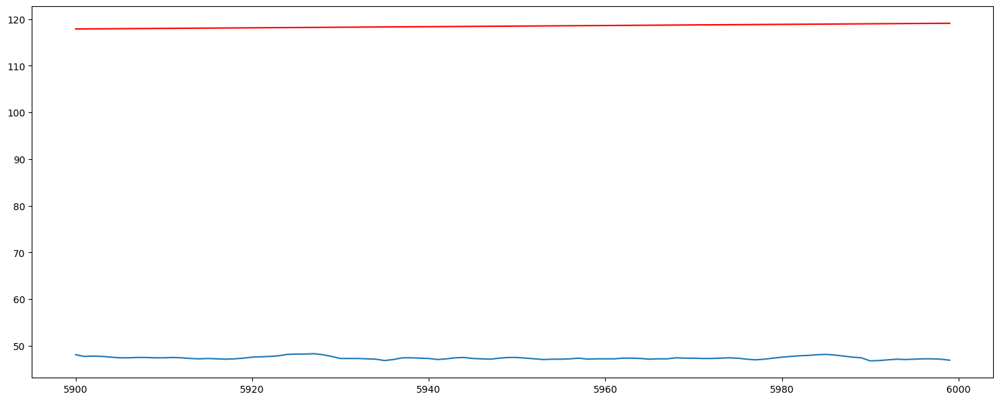

In [43]:
df[-100:]['T_hi [°C]'].plot()
df[-100:]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

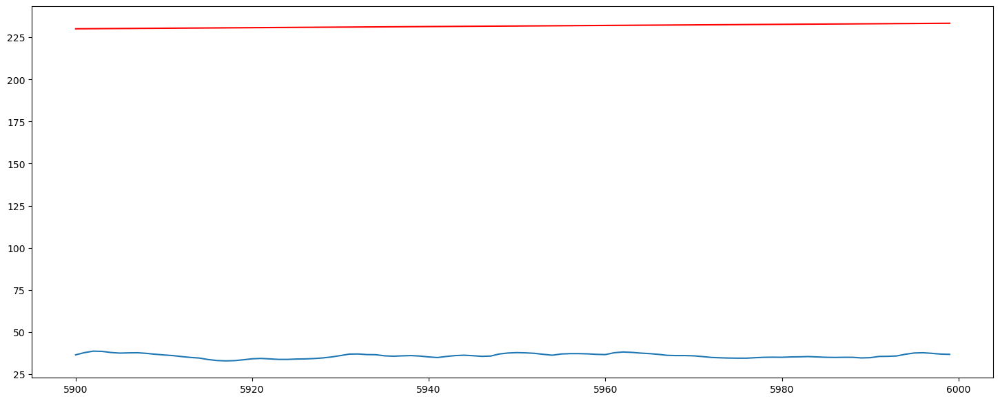

In [44]:
df[-100:]['T_ho [°C]'].plot()
df[-100:]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

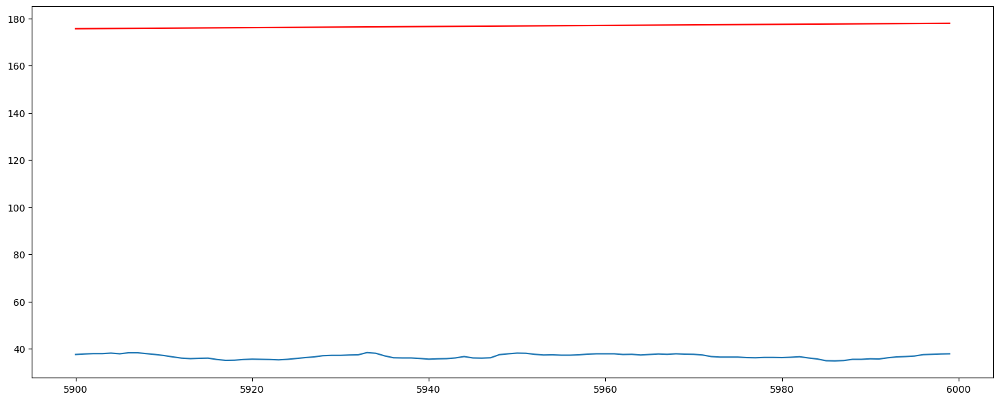

In [45]:
df[-100:]['T_co [°C]'].plot()
df[-100:]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

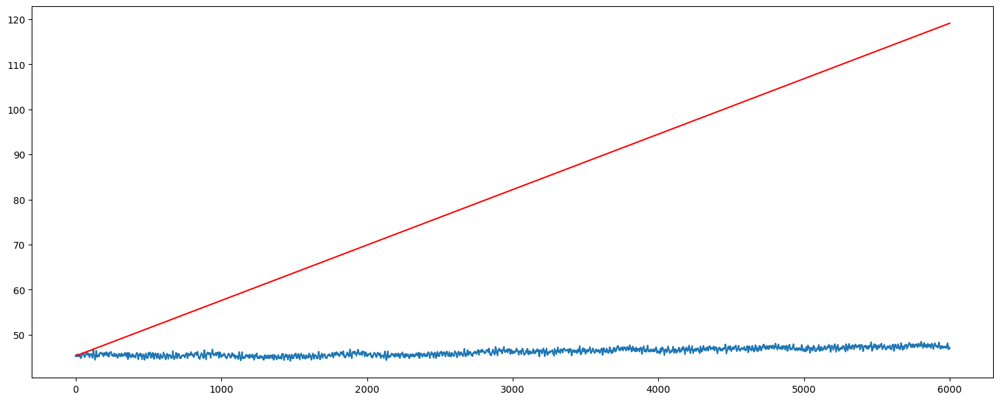

In [46]:
df['T_hi [°C]'].plot()
df['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

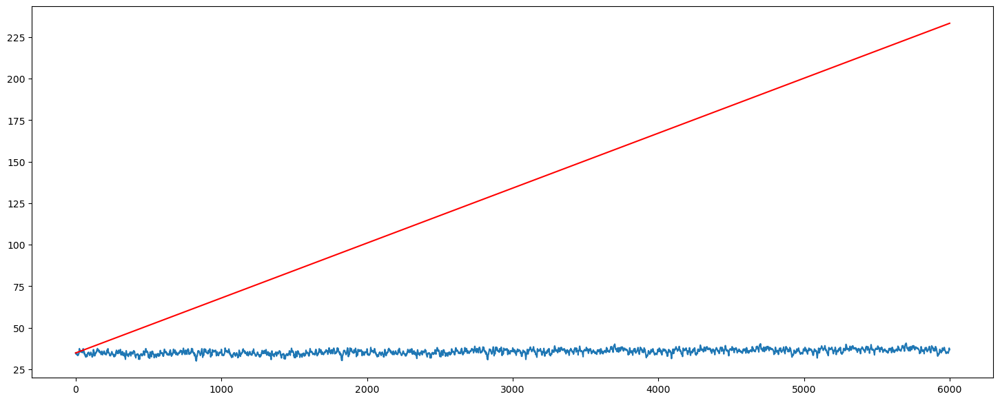

In [47]:
df['T_ho [°C]'].plot()
df['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

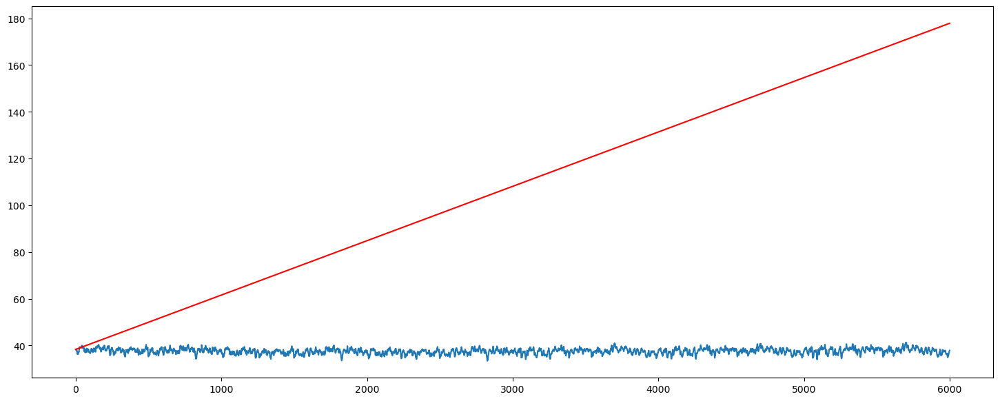

In [48]:
df['T_co [°C]'].plot()
df['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

## PBN

In [49]:
# Load model to device
model = PBNModel().to(device)
model.load_state_dict(torch.load('PBN_model.pth'))  
model.eval()  

# Loop through each row of the DataFrame
for index in range(len(df)-1):
    # Convert the row to a torch tensor
    input_tensor = torch.tensor(df.loc[index, features].values, dtype=torch.float32)

    # Add batch dimension by unsqueezing
    input_tensor = input_tensor.unsqueeze(0)  # Shape: [1, 10]
    input_tensor = input_tensor.to(device)
    
    # Forward pass through the model
    with torch.no_grad():  # No need to compute gradients
        output = model(input_tensor)

    # Process the output (remove batch dimension)
    output = output.squeeze(0).cpu().numpy()  # Shape: [6] if your model predicts 6 outputs

    # Store the model output in the corresponding columns of the DataFrame
    df.loc[index+1, targets] = output
    #if (index + 1) % 100 == 0: 
    #    df.loc[index+1, 'T_hi_est [°C]'] = df.loc[index+1, 'T_hi [°C]'] 

In [50]:
df['PBN T_hi [°C]'] = df['T_hi_est [°C]']
df['PBN T_ho [°C]'] = df['T_ho_est [°C]']
df['PBN T_co [°C]'] = df['T_co_est [°C]']

<Axes: >

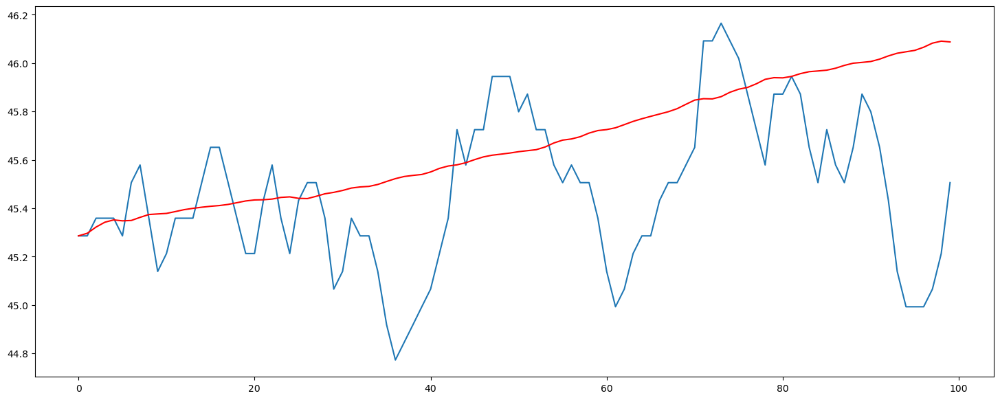

In [51]:
df[0:100]['T_hi [°C]'].plot()
df[0:100]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

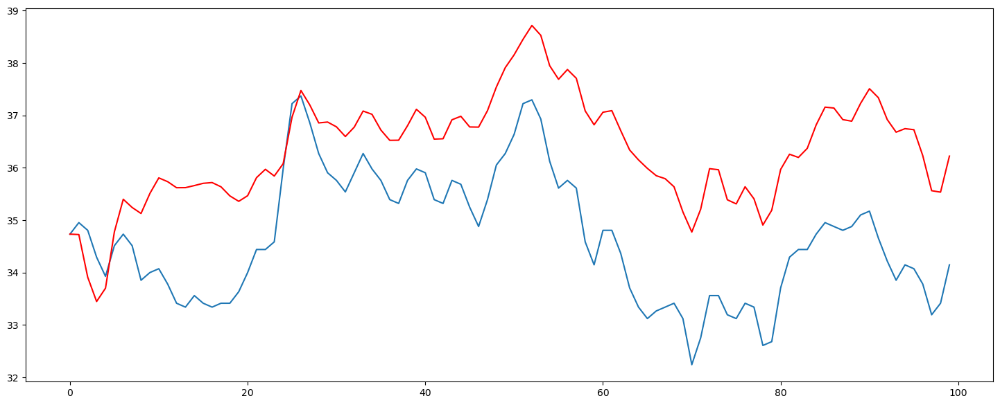

In [52]:
df[0:100]['T_ho [°C]'].plot()
df[0:100]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

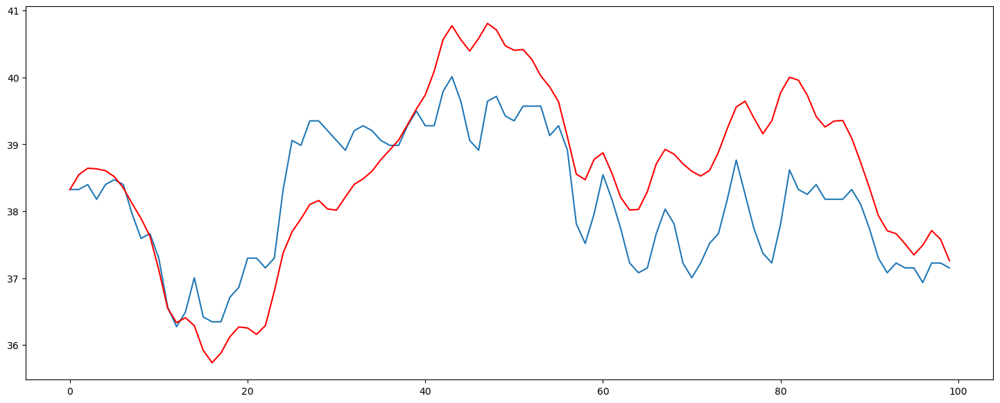

In [53]:
df[0:100]['T_co [°C]'].plot()
df[0:100]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

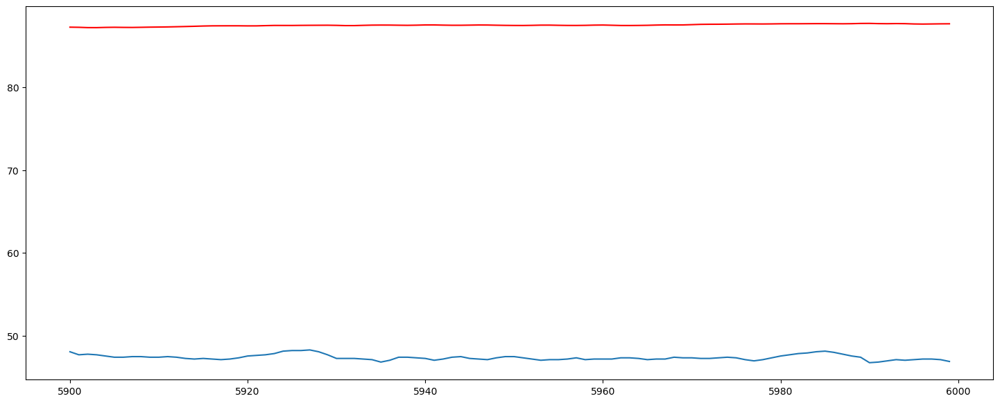

In [54]:
df[-100:]['T_hi [°C]'].plot()
df[-100:]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

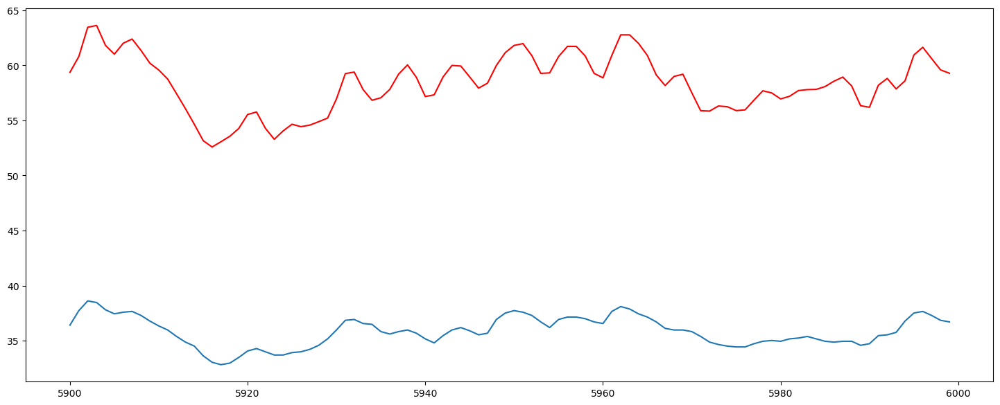

In [55]:
df[-100:]['T_ho [°C]'].plot()
df[-100:]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

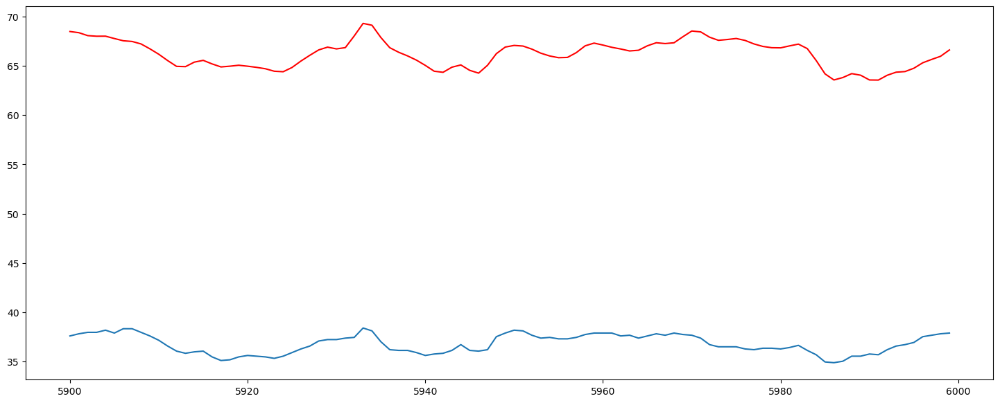

In [56]:
df[-100:]['T_co [°C]'].plot()
df[-100:]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

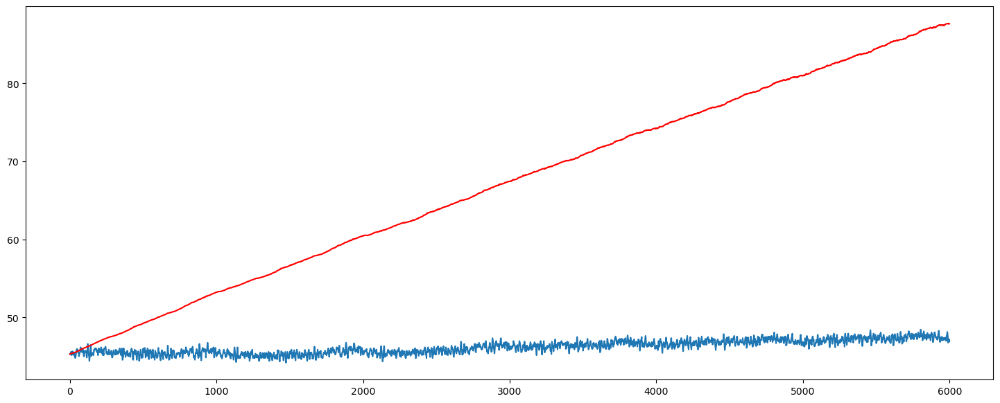

In [57]:
df['T_hi [°C]'].plot()
df['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

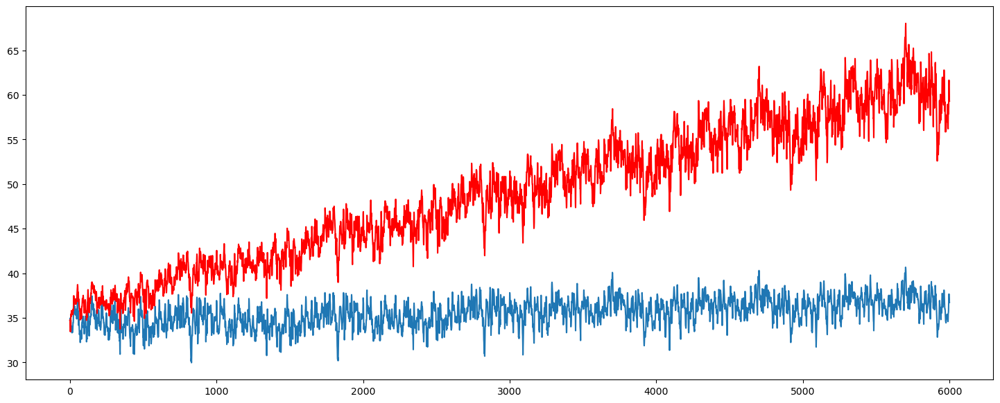

In [58]:
df['T_ho [°C]'].plot()
df['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

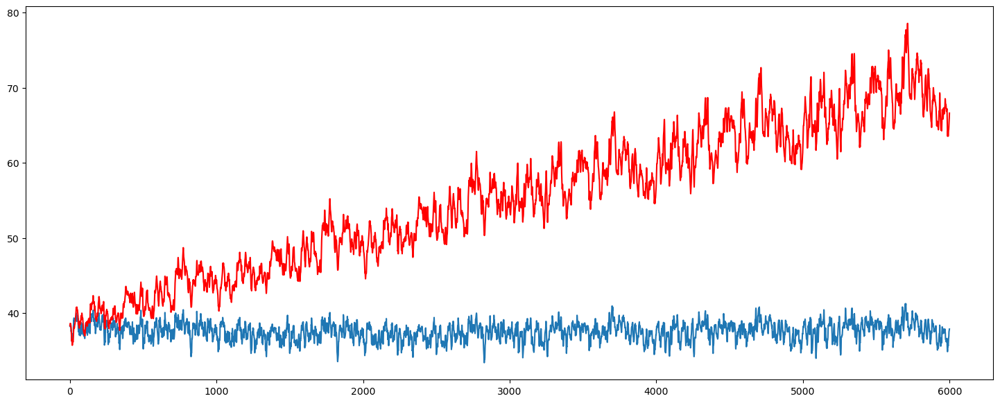

In [59]:
df['T_co [°C]'].plot()
df['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

## PBNN

In [60]:
# Load model to device
model = PBNNModel(drop_out=0.3).to(device)
model.load_state_dict(torch.load('BPNN_model.pth'))  
model.eval()  

# Loop through each row of the DataFrame
for index in range(len(df)-1):
    # Convert the row to a torch tensor
    input_tensor = torch.tensor(df.loc[index, features].values, dtype=torch.float32)

    # Add batch dimension by unsqueezing
    input_tensor = input_tensor.unsqueeze(0)  # Shape: [1, 10]
    input_tensor = input_tensor.to(device)
    
    # Forward pass through the model
    with torch.no_grad():  # No need to compute gradients
        output = model(input_tensor)

    # Process the output (remove batch dimension)
    output = output.squeeze(0).cpu().numpy()  # Shape: [6] if your model predicts 6 outputs

    # Store the model output in the corresponding columns of the DataFrame
    df.loc[index+1, targets] = output
    #if (index + 1) % 100 == 0: 
    #    df.loc[index+1, 'T_hi_est [°C]'] = df.loc[index+1, 'T_hi [°C]'] 

In [61]:
df['PBNN T_hi [°C]'] = df['T_hi_est [°C]']
df['PBNN T_ho [°C]'] = df['T_ho_est [°C]']
df['PBNN T_co [°C]'] = df['T_co_est [°C]']

<Axes: >

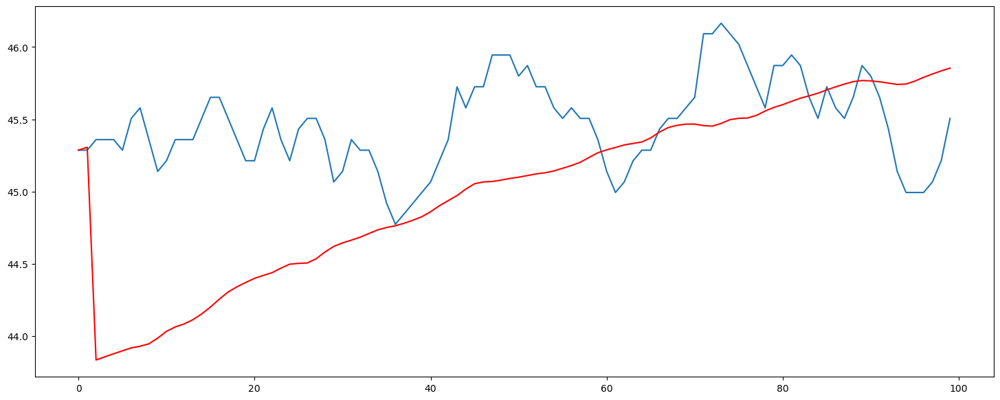

In [62]:
df[0:100]['T_hi [°C]'].plot()
df[0:100]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

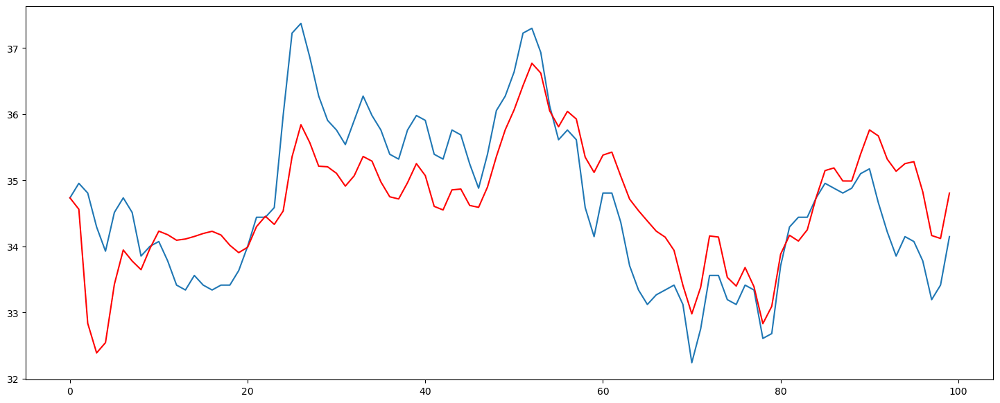

In [63]:
df[0:100]['T_ho [°C]'].plot()
df[0:100]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

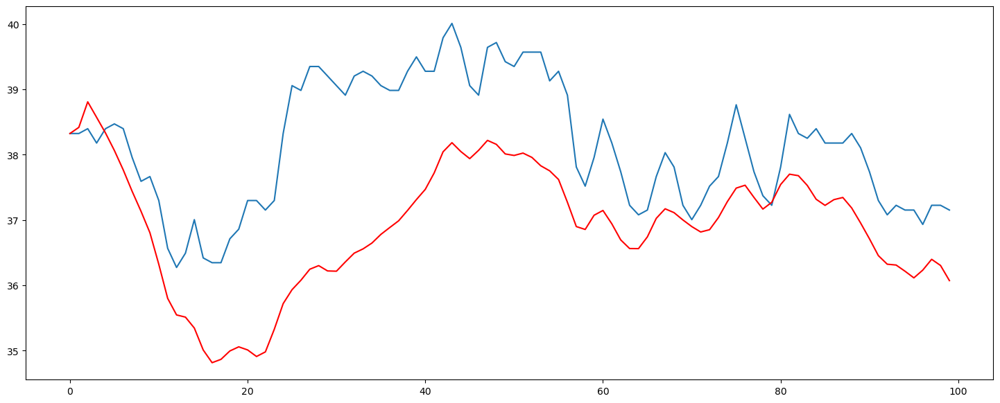

In [64]:
df[0:100]['T_co [°C]'].plot()
df[0:100]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

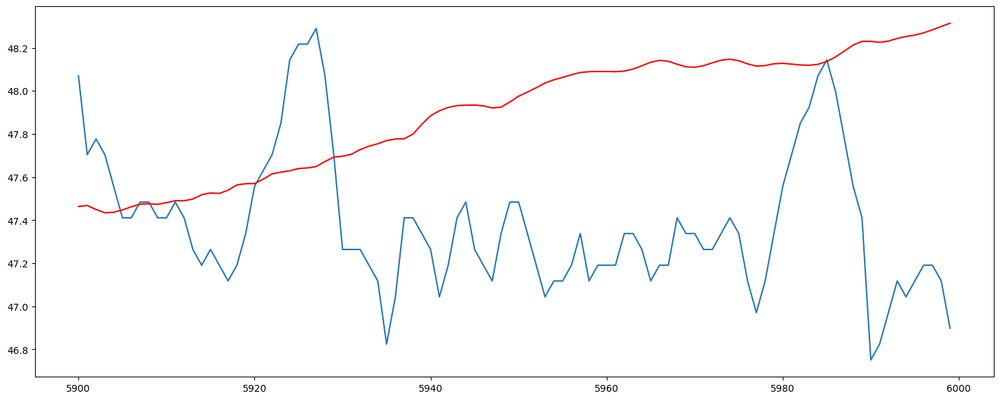

In [65]:
df[-100:]['T_hi [°C]'].plot()
df[-100:]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

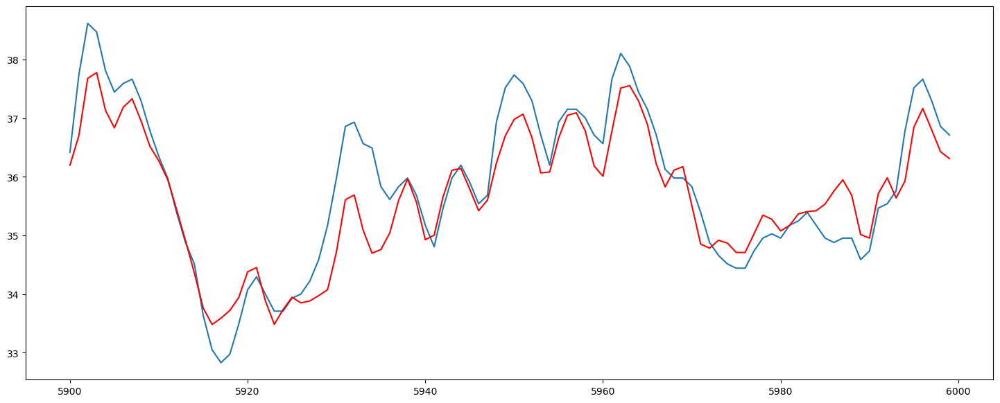

In [66]:
df[-100:]['T_ho [°C]'].plot()
df[-100:]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

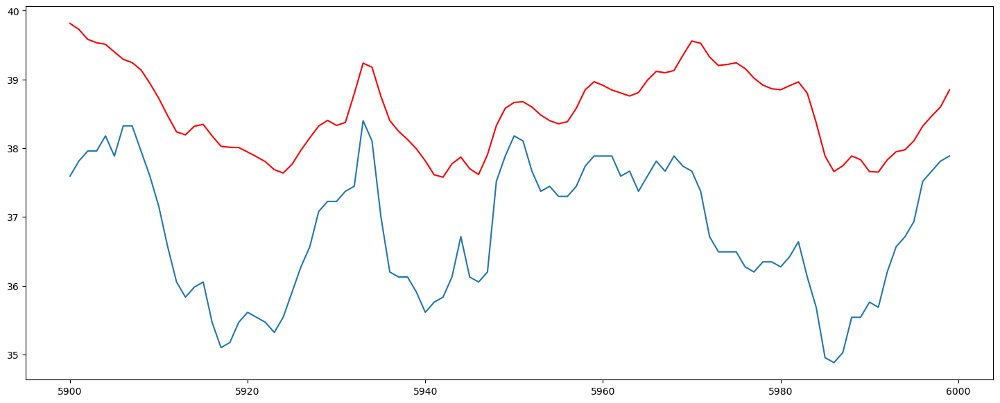

In [67]:
df[-100:]['T_co [°C]'].plot()
df[-100:]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

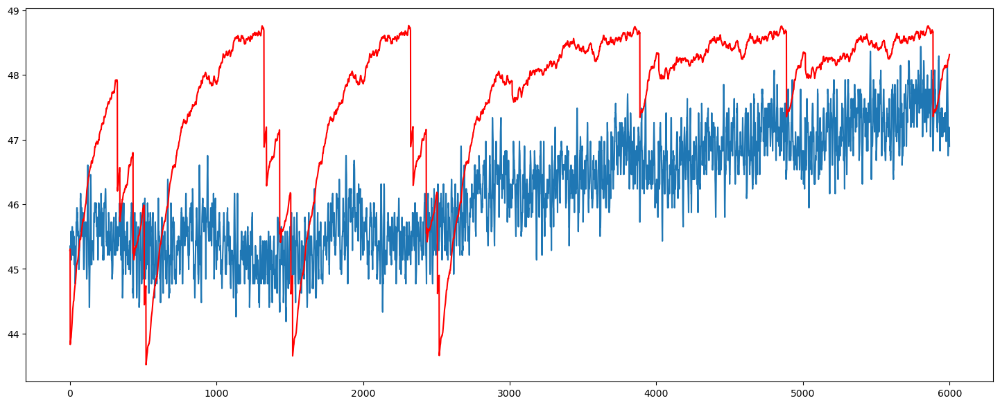

In [68]:
df['T_hi [°C]'].plot()
df['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

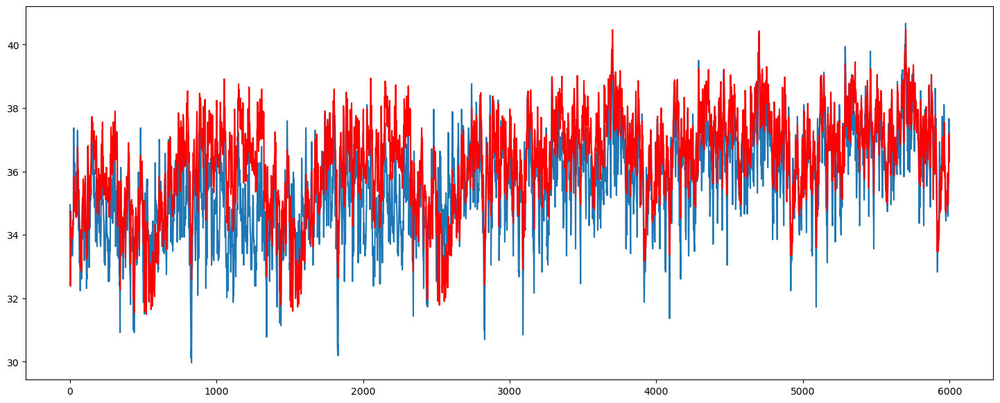

In [69]:
df['T_ho [°C]'].plot()
df['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

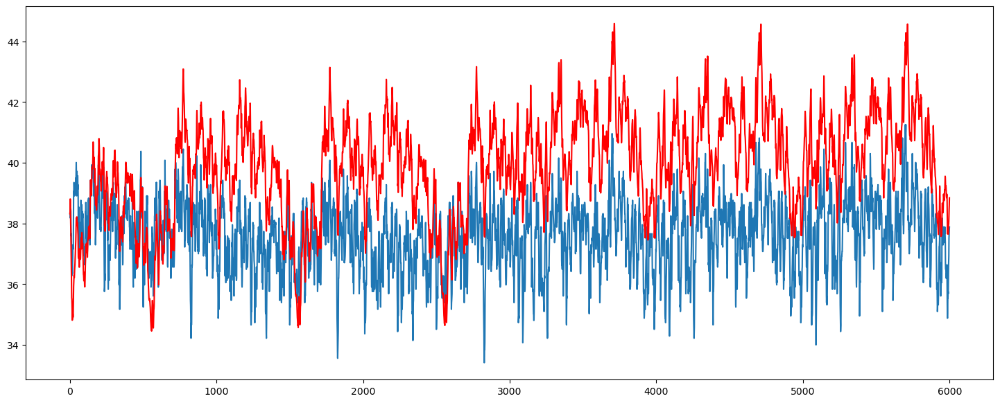

In [70]:
df['T_co [°C]'].plot()
df['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

## FNNR bias corrected

In [71]:
bias_1 = -0.012
bias_2 = -0.033
bias_3 = -0.0235

In [72]:
# Load model to device
model = FNNRModel(drop_out=0.3).to(device)
model.load_state_dict(torch.load('FNNR_model.pth'))  
model.eval()  

# Loop through each row of the DataFrame
for index in range(len(df)-1):
    # Convert the row to a torch tensor
    input_tensor = torch.tensor(df.loc[index, features].values, dtype=torch.float32)

    # Add batch dimension by unsqueezing
    input_tensor = input_tensor.unsqueeze(0)  # Shape: [1, 10]
    input_tensor = input_tensor.to(device)
    
    # Forward pass through the model
    with torch.no_grad():  # No need to compute gradients
        output = model(input_tensor)

    # Process the output (remove batch dimension)
    output = output.squeeze(0).cpu().numpy()  # Shape: [6] if your model predicts 6 outputs

    # Store the model output in the corresponding columns of the DataFrame
    df.loc[index+1, targets] = output

In [73]:
df['FNNR T_hi [°C] bias corrected'] = df['T_hi_est [°C]']
df['FNNR T_ho [°C] bias corrected'] = df['T_ho_est [°C]']
df['FNNR T_co [°C] bias corrected'] = df['T_co_est [°C]']

<Axes: >

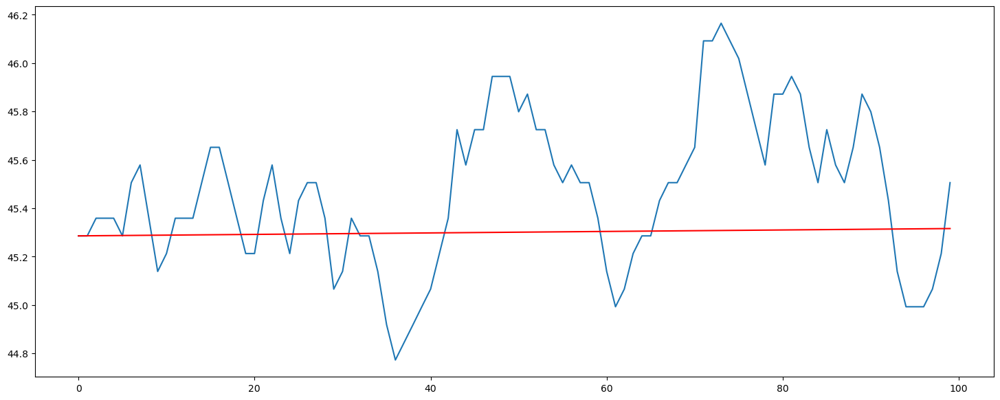

In [74]:
df[0:100]['T_hi [°C]'].plot()
df[0:100]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

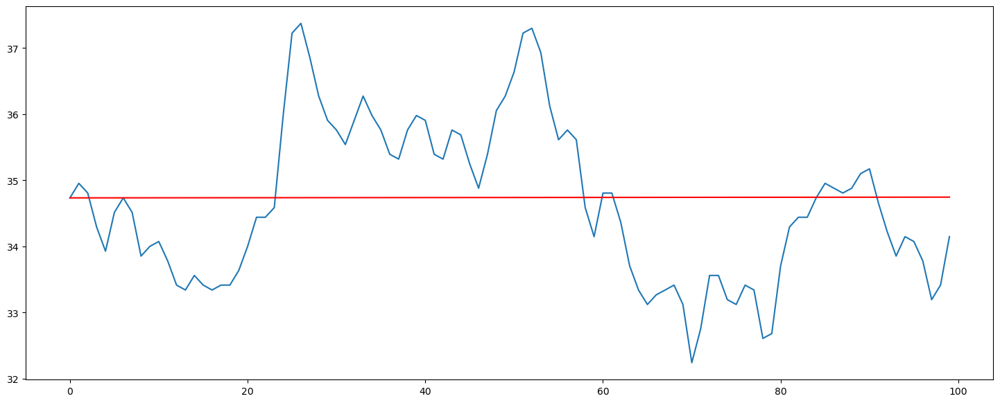

In [75]:
df[0:100]['T_ho [°C]'].plot()
df[0:100]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

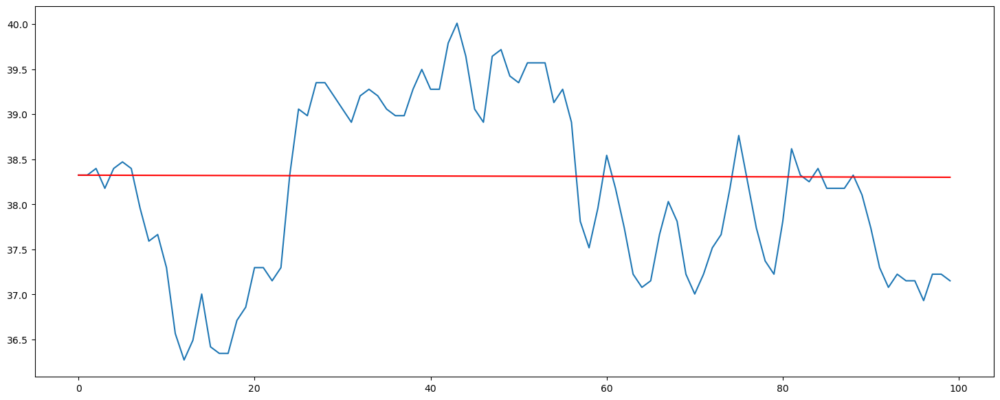

In [76]:
df[0:100]['T_co [°C]'].plot()
df[0:100]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

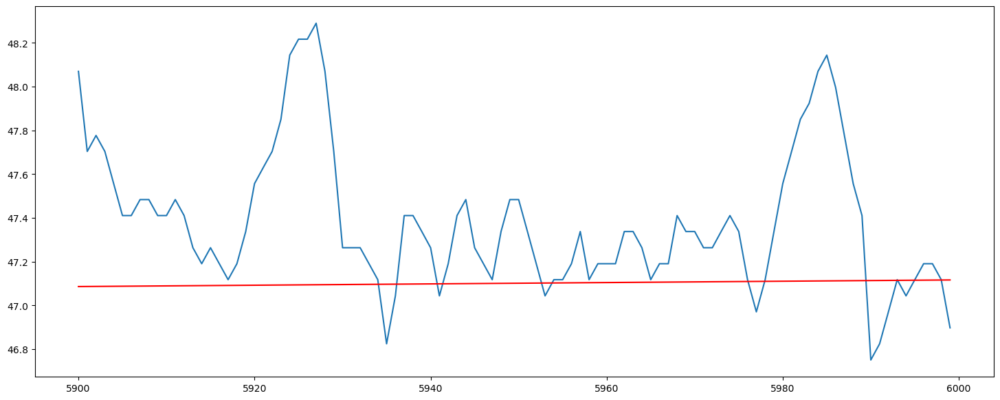

In [77]:
df[-100:]['T_hi [°C]'].plot()
df[-100:]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

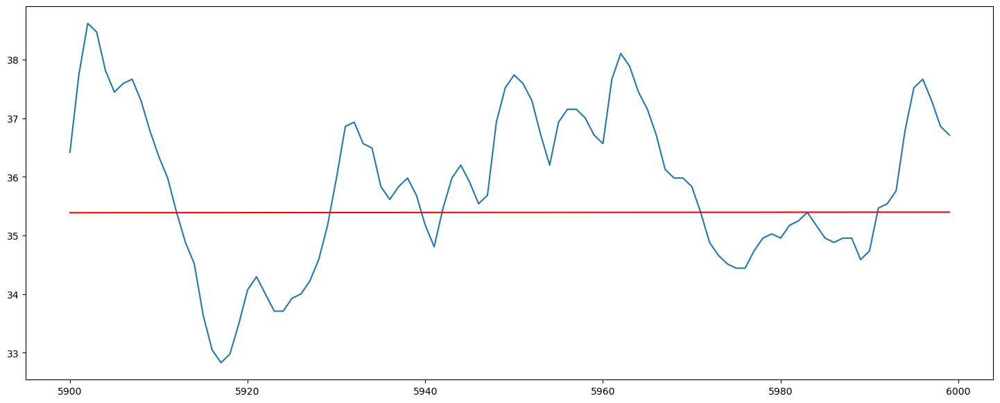

In [78]:
df[-100:]['T_ho [°C]'].plot()
df[-100:]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

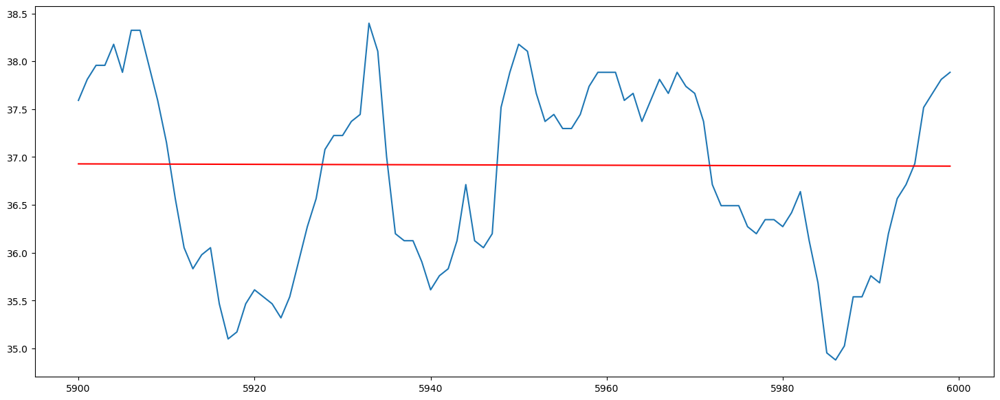

In [79]:
df[-100:]['T_co [°C]'].plot()
df[-100:]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

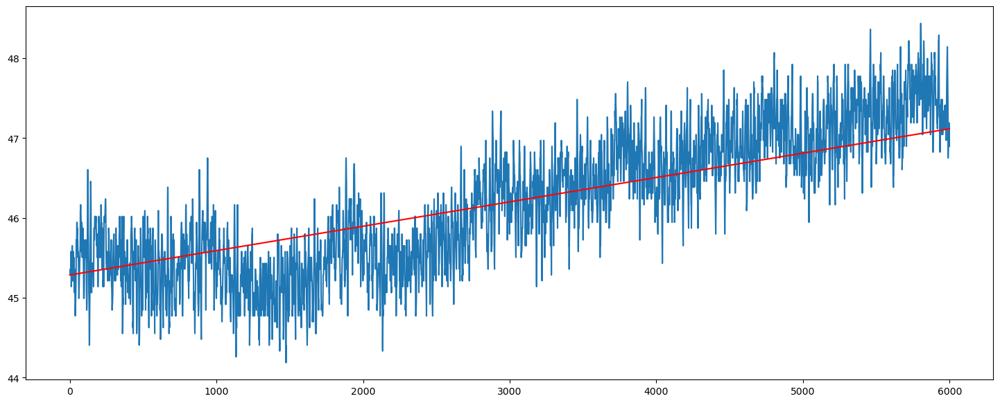

In [80]:
df['T_hi [°C]'].plot()
df['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

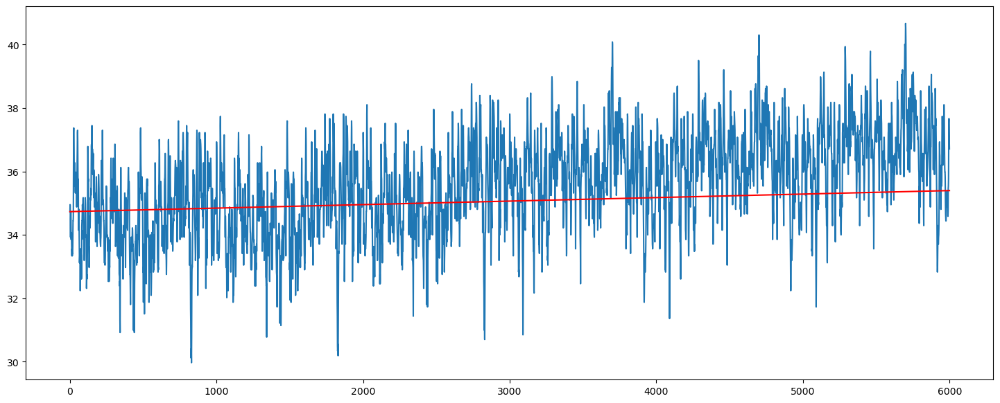

In [81]:
df['T_ho [°C]'].plot()
df['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

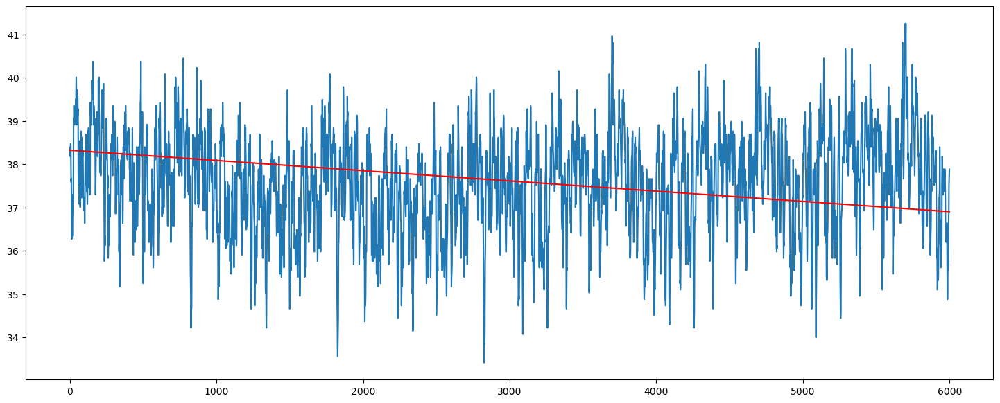

In [82]:
df['T_co [°C]'].plot()
df['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

## PBN bias corrected

In [83]:
bias_1 = -0.0066
bias_2 = -0.02
bias_3 = -0.084

In [84]:
# Load model to device
model = PBNModel().to(device)
model.load_state_dict(torch.load('PBN_model.pth'))  
model.eval()  

# Loop through each row of the DataFrame
for index in range(len(df)-1):
    # Convert the row to a torch tensor
    input_tensor = torch.tensor(df.loc[index, features].values, dtype=torch.float32)

    # Add batch dimension by unsqueezing
    input_tensor = input_tensor.unsqueeze(0)  # Shape: [1, 10]
    input_tensor = input_tensor.to(device)
    
    # Forward pass through the model
    with torch.no_grad():  # No need to compute gradients
        output = model(input_tensor)

    # Process the output (remove batch dimension)
    output = output.squeeze(0).cpu().numpy()  # Shape: [6] if your model predicts 6 outputs

    # Store the model output in the corresponding columns of the DataFrame
    df.loc[index+1, targets] = output
    #if (index + 1) % 100 == 0: 
    #    df.loc[index+1, 'T_hi_est [°C]'] = df.loc[index+1, 'T_hi [°C]'] 

In [85]:
df['PBN T_hi [°C] bias corrected'] = df['T_hi_est [°C]']
df['PBN T_ho [°C] bias corrected'] = df['T_ho_est [°C]']
df['PBN T_co [°C] bias corrected'] = df['T_co_est [°C]']

<Axes: >

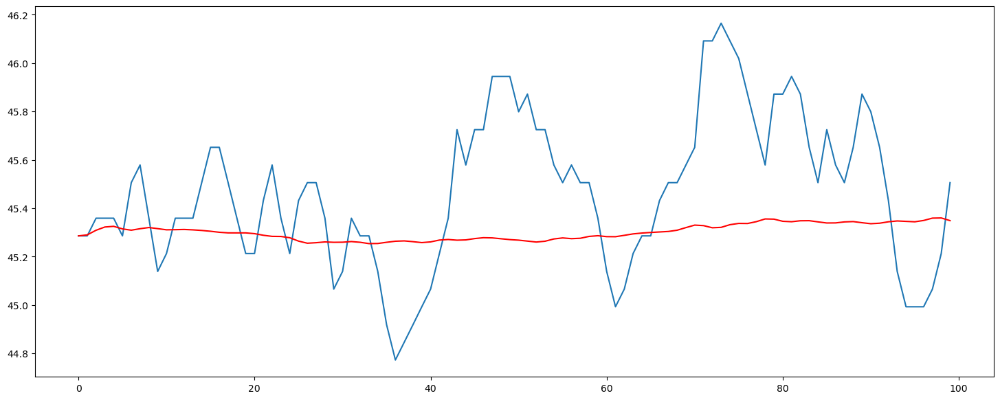

In [86]:
df[0:100]['T_hi [°C]'].plot()
df[0:100]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

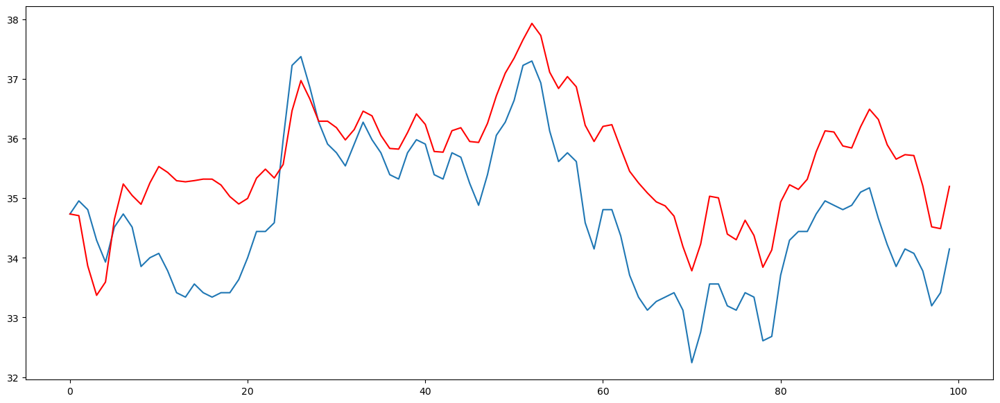

In [87]:
df[0:100]['T_ho [°C]'].plot()
df[0:100]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

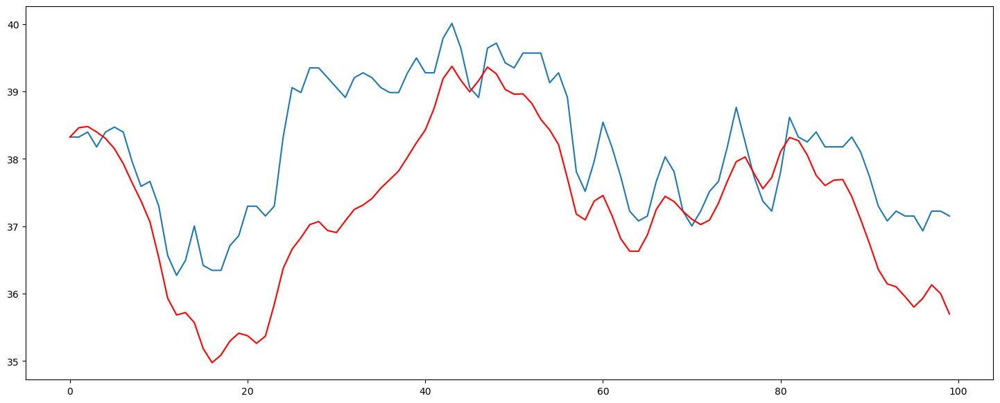

In [88]:
df[0:100]['T_co [°C]'].plot()
df[0:100]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

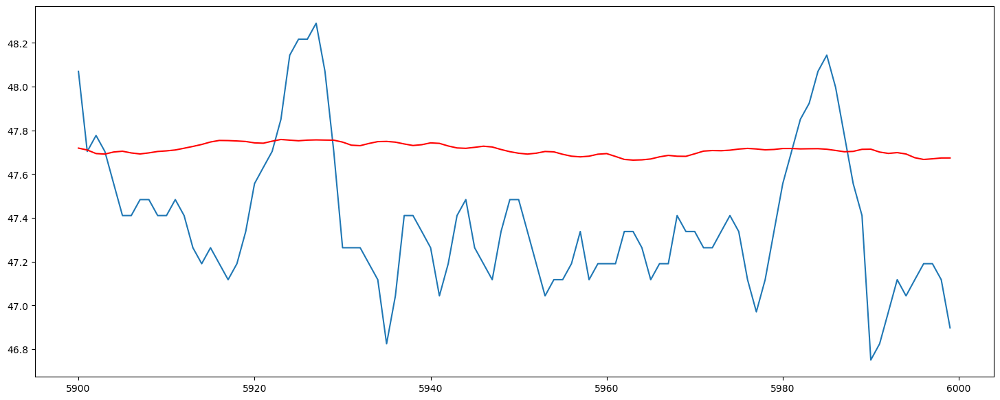

In [89]:
df[-100:]['T_hi [°C]'].plot()
df[-100:]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

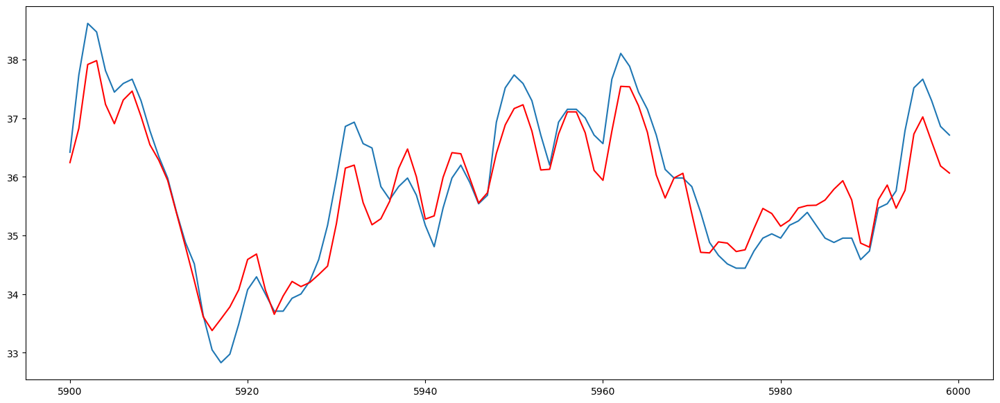

In [90]:
df[-100:]['T_ho [°C]'].plot()
df[-100:]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

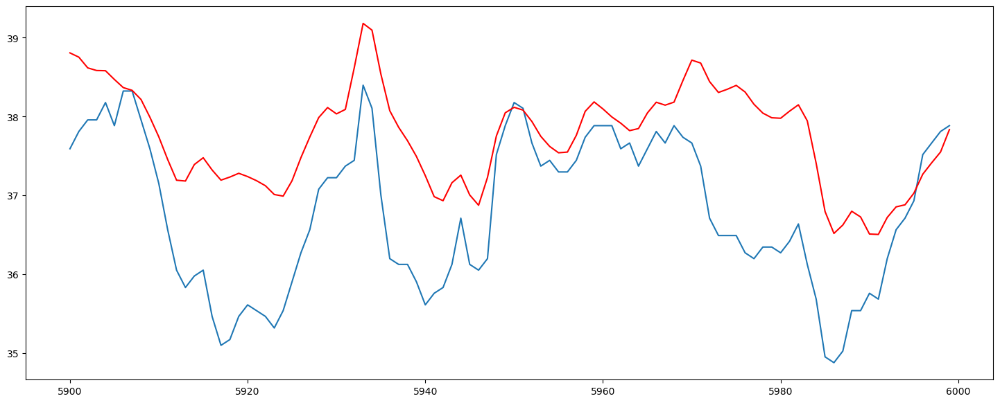

In [91]:
df[-100:]['T_co [°C]'].plot()
df[-100:]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

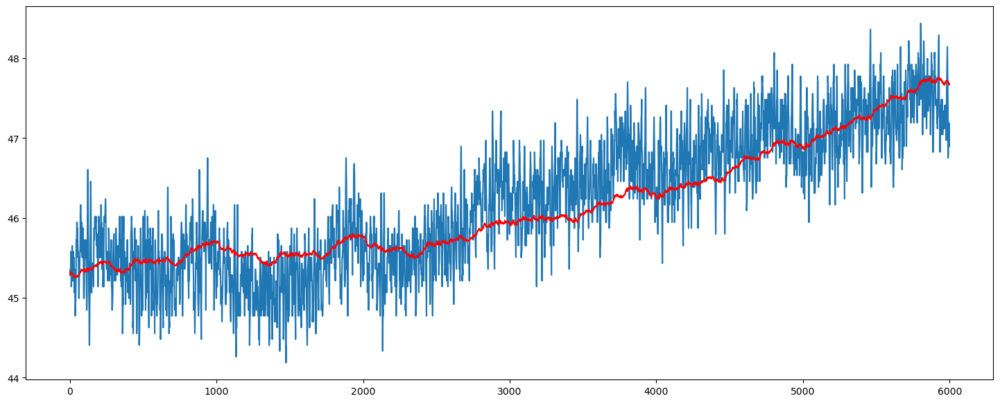

In [92]:
df['T_hi [°C]'].plot()
df['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

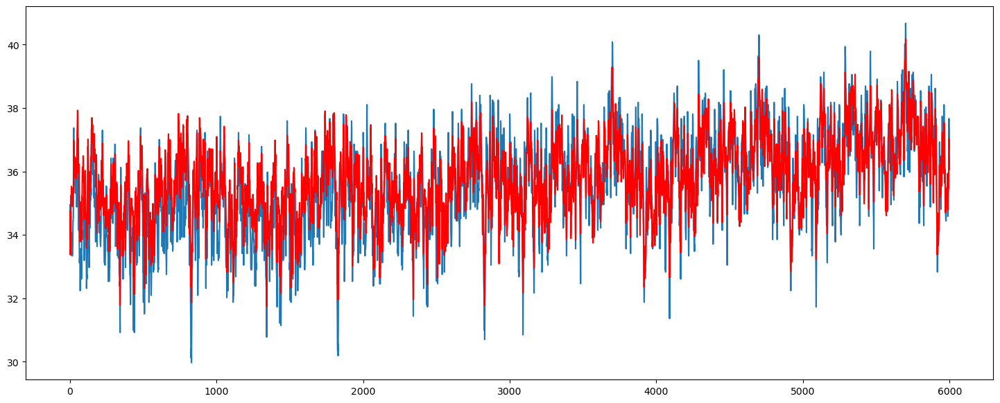

In [93]:
df['T_ho [°C]'].plot()
df['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

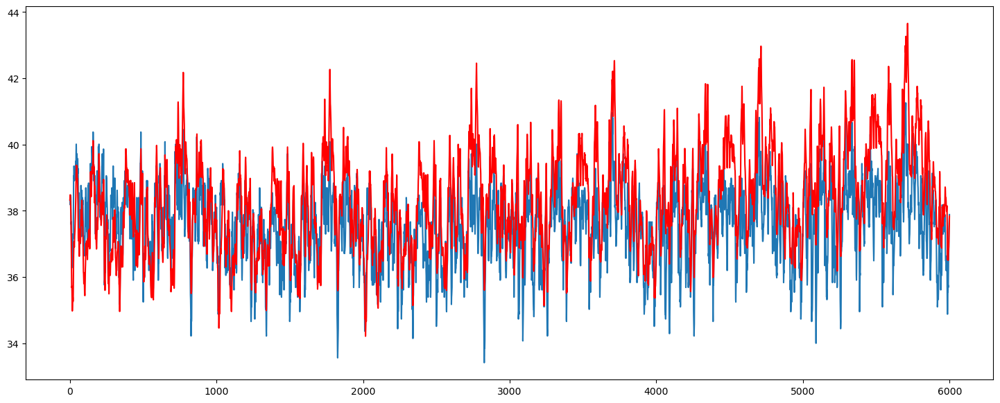

In [94]:
df['T_co [°C]'].plot()
df['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

## PBNN bias corrected

In [95]:
bias_1 = -0.004
bias_2 = +0.01
bias_3 = -0.1

In [96]:
# Load model to device
model = PBNNModel(drop_out=0.3).to(device)
model.load_state_dict(torch.load('BPNN_model.pth'))  
model.eval()  

# Loop through each row of the DataFrame
for index in range(len(df)-1):
    # Convert the row to a torch tensor
    input_tensor = torch.tensor(df.loc[index, features].values, dtype=torch.float32)

    # Add batch dimension by unsqueezing
    input_tensor = input_tensor.unsqueeze(0)  # Shape: [1, 10]
    input_tensor = input_tensor.to(device)
    
    # Forward pass through the model
    with torch.no_grad():  # No need to compute gradients
        output = model(input_tensor)

    # Process the output (remove batch dimension)
    output = output.squeeze(0).cpu().numpy()  # Shape: [6] if your model predicts 6 outputs

    # Store the model output in the corresponding columns of the DataFrame
    df.loc[index+1, targets] = output
    #if (index + 1) % 100 == 0: 
    #    df.loc[index+1, 'T_hi_est [°C]'] = df.loc[index+1, 'T_hi [°C]'] 

In [97]:
df['PBNN T_hi [°C] bias corrected'] = df['T_hi_est [°C]']
df['PBNN T_ho [°C] bias corrected'] = df['T_ho_est [°C]']
df['PBNN T_co [°C] bias corrected'] = df['T_co_est [°C]']

<Axes: >

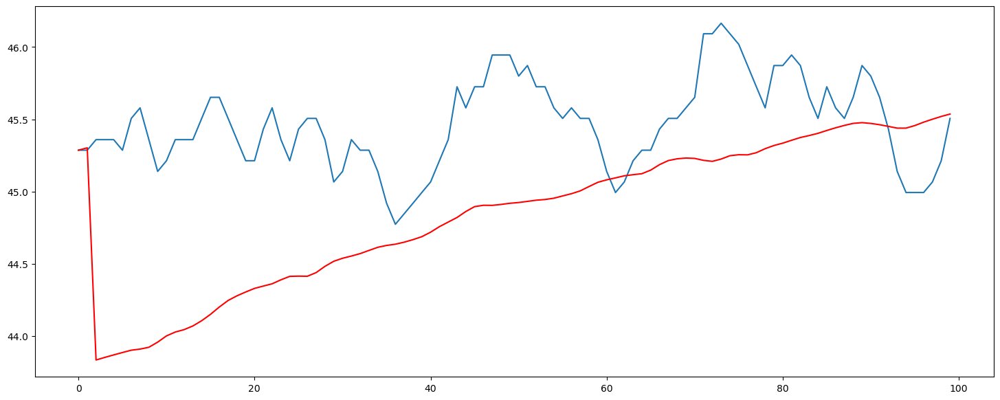

In [98]:
df[0:100]['T_hi [°C]'].plot()
df[0:100]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

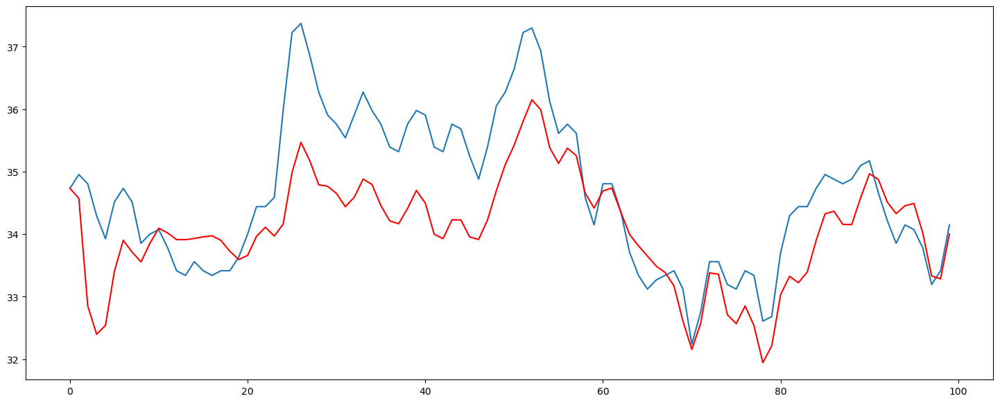

In [99]:
df[0:100]['T_ho [°C]'].plot()
df[0:100]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

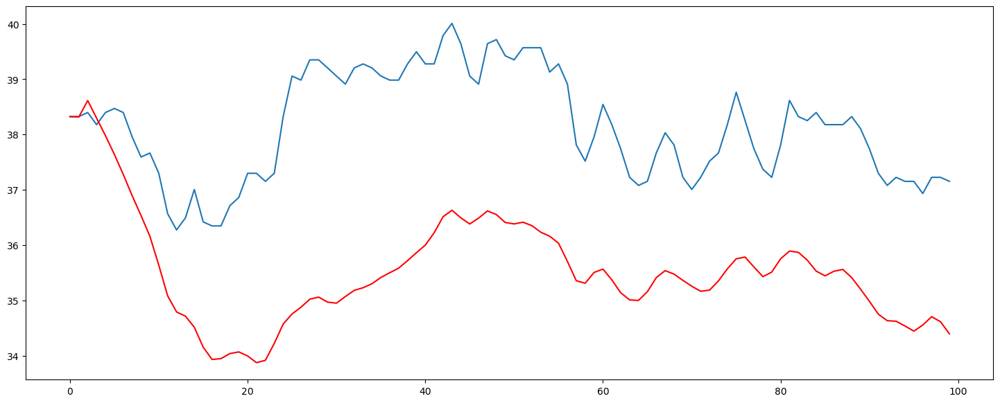

In [100]:
df[0:100]['T_co [°C]'].plot()
df[0:100]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

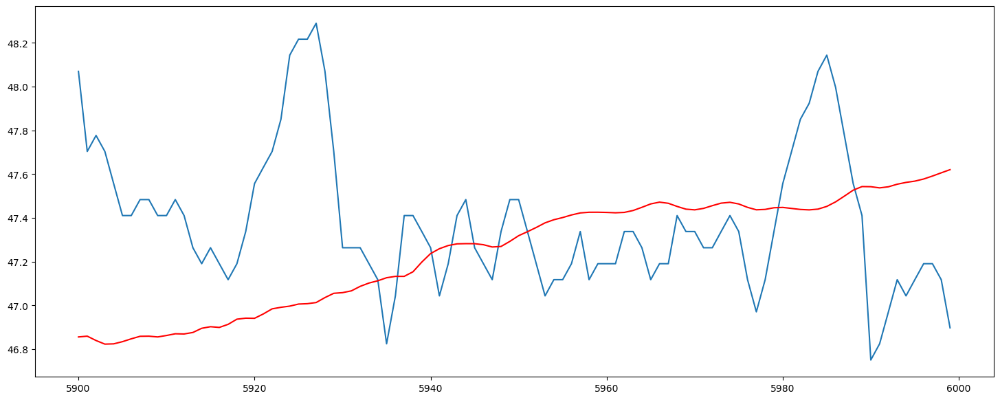

In [101]:
df[-100:]['T_hi [°C]'].plot()
df[-100:]['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

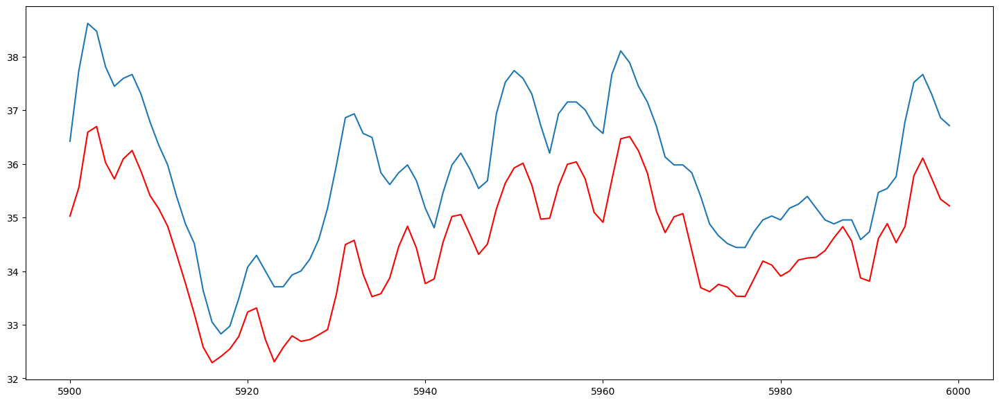

In [102]:
df[-100:]['T_ho [°C]'].plot()
df[-100:]['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

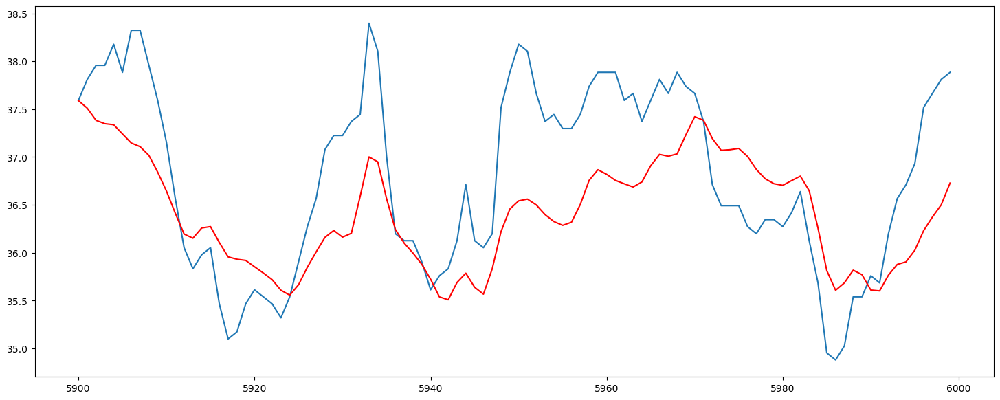

In [103]:
df[-100:]['T_co [°C]'].plot()
df[-100:]['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

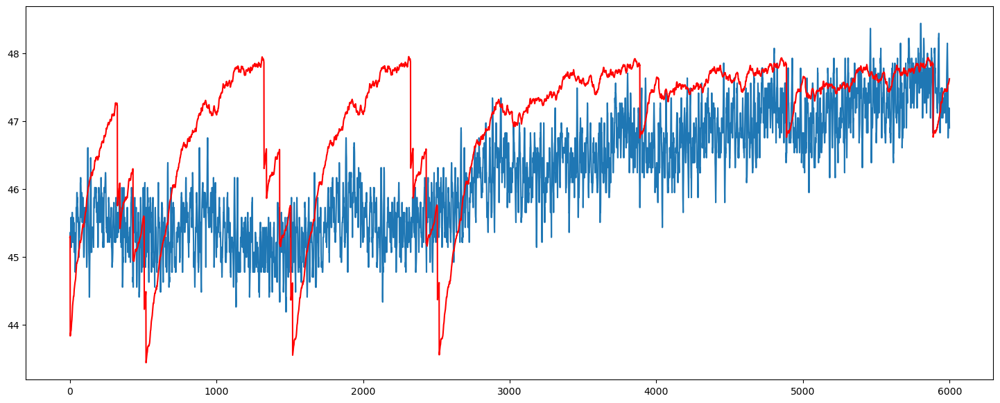

In [104]:
df['T_hi [°C]'].plot()
df['T_hi_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

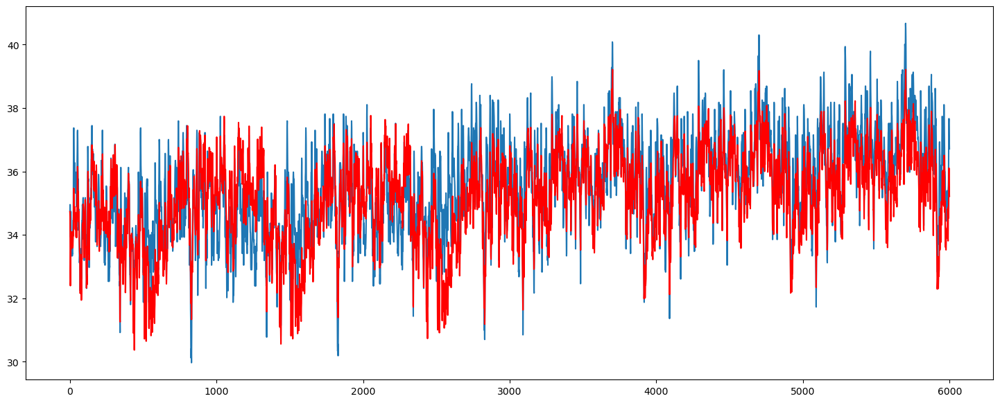

In [105]:
df['T_ho [°C]'].plot()
df['T_ho_est [°C]'].plot(color = 'red', figsize = [18,7])

<Axes: >

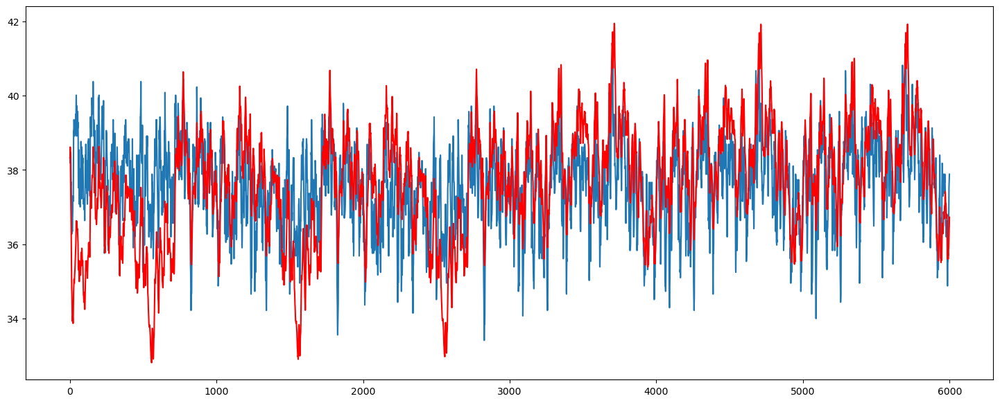

In [106]:
df['T_co [°C]'].plot()
df['T_co_est [°C]'].plot(color = 'red', figsize = [18,7])

## Summary

### V_c

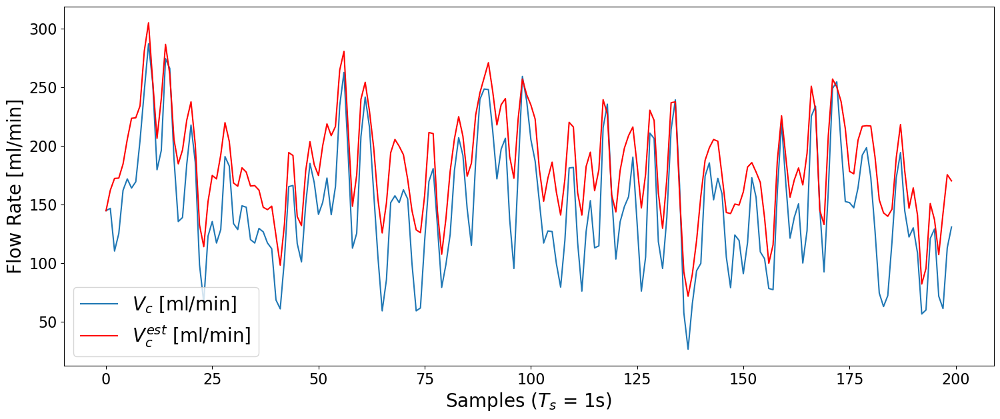

In [107]:
df[:200]['V_c [ml/min]'].plot(label = '$V_c$ [ml/min]')
df[:200]['V_c_est [ml/min]'].plot(color = 'red', figsize = [18,7], label = '$V_c^{est}$ [ml/min]')

# Adding labels and legend
#plt.title('$V_c$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20) 
plt.ylabel('Flow Rate [ml/min]', fontsize=20) 
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/V_c_comparison_plot.png')

# Display the plot
plt.show()

### P

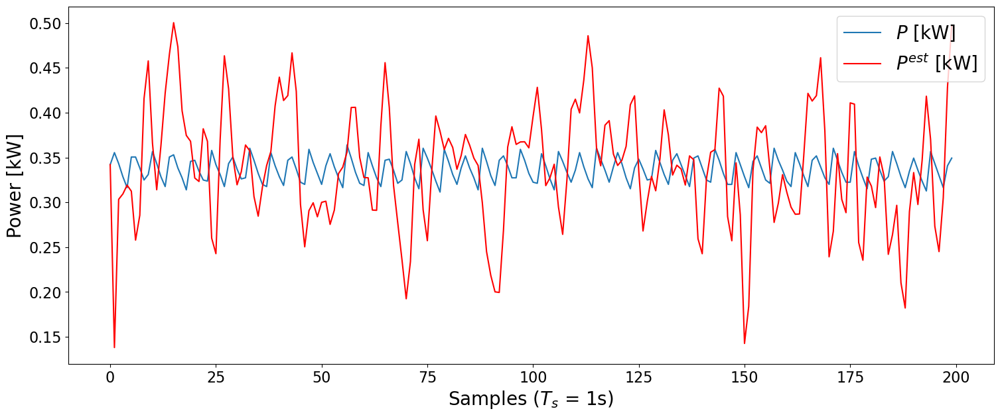

In [108]:
df[:200]['P [kW]'].plot(label = '$P$ [kW]')
df[:200]['P_est [kW]'].plot(color = 'red', figsize = [18,7], label = '$P^{est}$ [kW]')

# Adding labels and legend
# plt.title('P Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Power [kW]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/P_comparison_plot.png')

# Display the plot
plt.show()

### T_hi

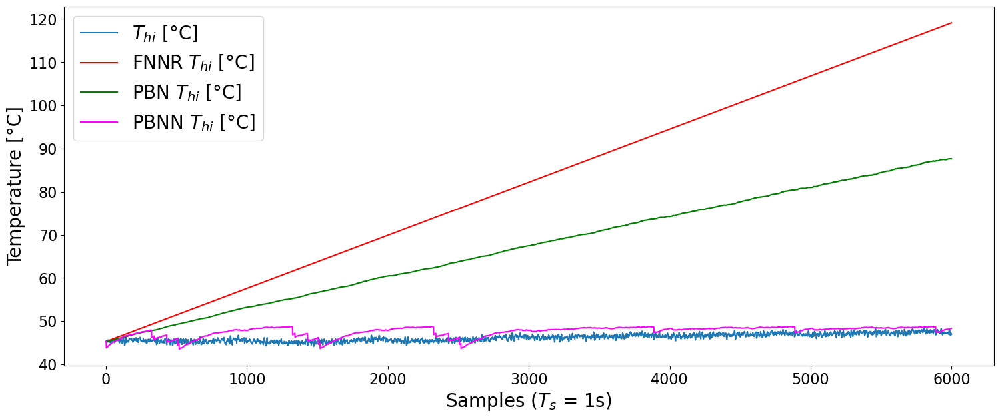

In [109]:
df['T_hi [°C]'].plot(label = '$T_{hi}$ [°C]')
df['FNNR T_hi [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{hi}$ [°C]')
df['PBN T_hi [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{hi}$ [°C]')
df['PBNN T_hi [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{hi}$ [°C]')

# Adding labels and legend
# plt.title('$T_{hi}$  Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_hi_comparison_plot.png')

# Display the plot
plt.show()

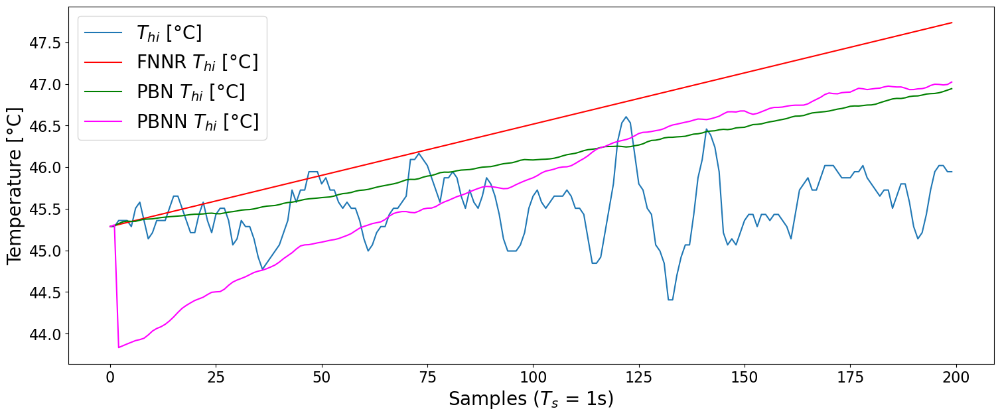

In [110]:
df[:200]['T_hi [°C]'].plot(label = '$T_{hi}$ [°C]')
df[:200]['FNNR T_hi [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{hi}$ [°C]')
df[:200]['PBN T_hi [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{hi}$ [°C]')
df[:200:]['PBNN T_hi [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{hi}$ [°C]')

# Adding labels and legend
# plt.title('$T_{hi}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_hi_comparison_plot_first_200.png')

# Display the plot
plt.show()

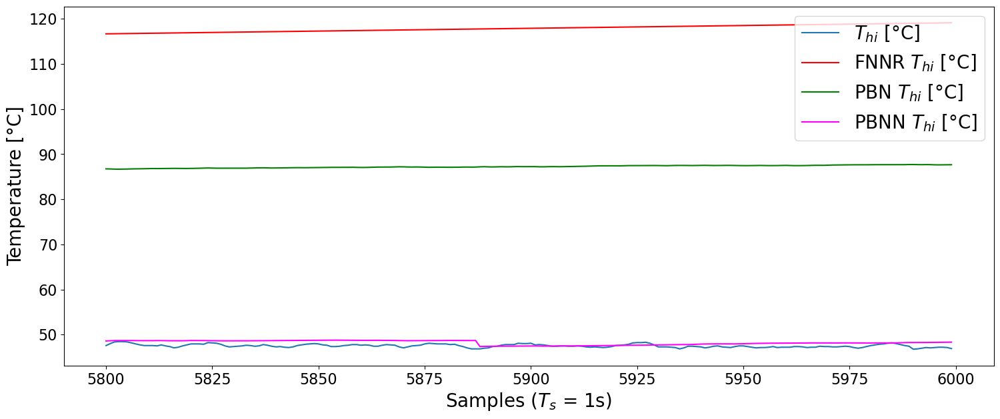

In [111]:
df[-200:]['T_hi [°C]'].plot(label = '$T_{hi}$ [°C]')
df[-200:]['FNNR T_hi [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{hi}$ [°C]')
df[-200:]['PBN T_hi [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{hi}$ [°C]')
df[-200:]['PBNN T_hi [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{hi}$ [°C]')

# Adding labels and legend
# plt.title('$T_{hi}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_hi_comparison_plot_last_200.png')

# Display the plot
plt.show()

### T_hi bias corrected

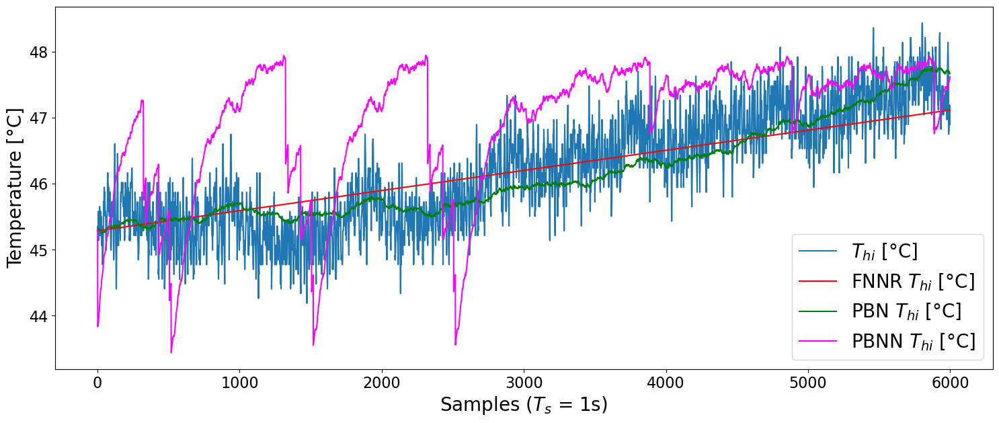

In [112]:
df['T_hi [°C]'].plot(label = '$T_{hi}$ [°C]')
df['FNNR T_hi [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{hi}$ [°C]')
df['PBN T_hi [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{hi}$ [°C]')
df['PBNN T_hi [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{hi}$ [°C]')

# Adding labels and legend
# plt.title('$T_{hi}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_hi_comparison_plot_bias.png')

# Display the plot
plt.show()

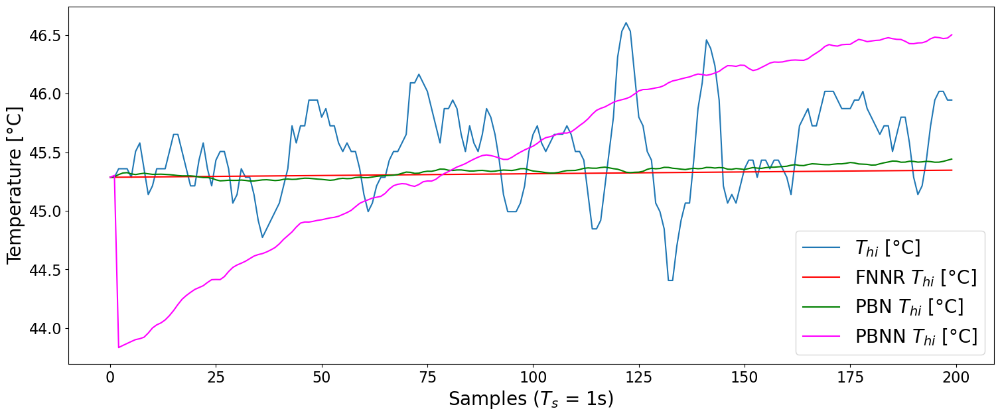

In [113]:
df[:200]['T_hi [°C]'].plot(label = '$T_{hi}$ [°C]')
df[:200]['FNNR T_hi [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{hi}$ [°C]')
df[:200]['PBN T_hi [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{hi}$ [°C]')
df[:200]['PBNN T_hi [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{hi}$ [°C]')

# Adding labels and legend
# plt.title('$T_{hi}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_hi_comparison_plot_bias_first_200.png')

# Display the plot
plt.show()

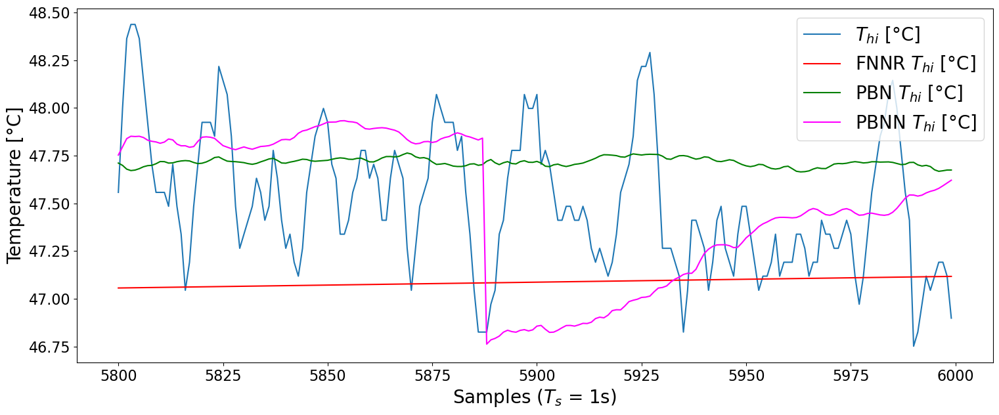

In [114]:
df[-200:]['T_hi [°C]'].plot(label = '$T_{hi}$ [°C]')
df[-200:]['FNNR T_hi [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{hi}$ [°C]')
df[-200:]['PBN T_hi [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{hi}$ [°C]')
df[-200:]['PBNN T_hi [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{hi}$ [°C]')

# Adding labels and legend
# plt.title('$T_{hi}$  Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_hi_comparison_plot_bias_last_200.png')

# Display the plot
plt.show()

### T_ho

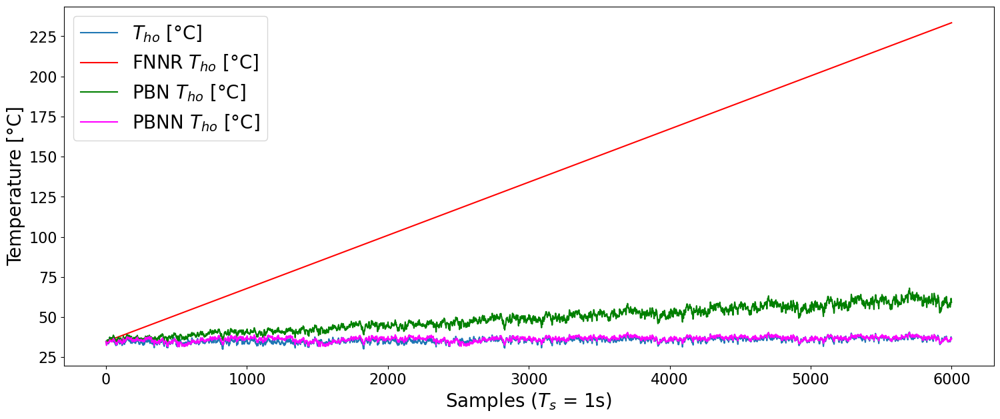

In [115]:
df['T_ho [°C]'].plot(label = '$T_{ho}$ [°C]')
df['FNNR T_ho [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{ho}$ [°C]')
df['PBN T_ho [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{ho}$ [°C]')
df['PBNN T_ho [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{ho}$ [°C]')

# Adding labels and legend
# plt.title('$T_{ho}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_ho_comparison_plot.png')

# Display the plot
plt.show()

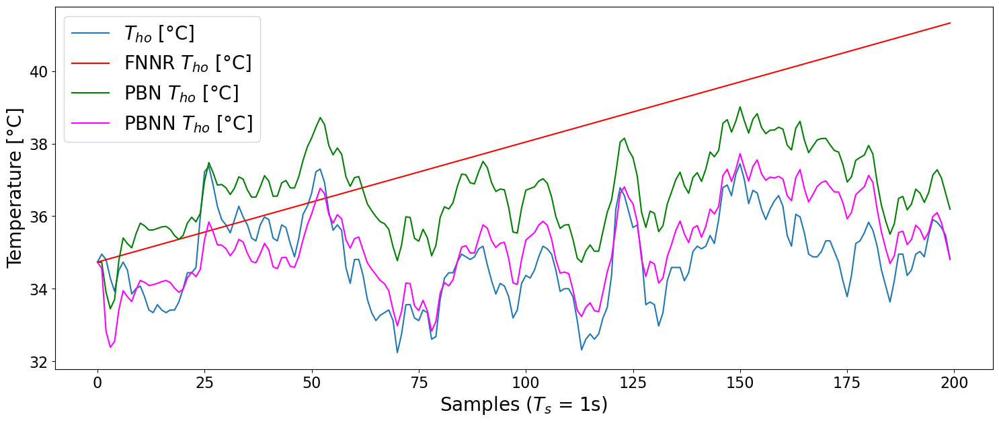

In [116]:
df[:200]['T_ho [°C]'].plot(label = '$T_{ho}$ [°C]')
df[:200]['FNNR T_ho [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{ho}$ [°C]')
df[:200]['PBN T_ho [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{ho}$ [°C]')
df[:200]['PBNN T_ho [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{ho}$ [°C]')

# Adding labels and legend
# plt.title('$T_{ho}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_ho_comparison_plot_first_200.png')

# Display the plot
plt.show()

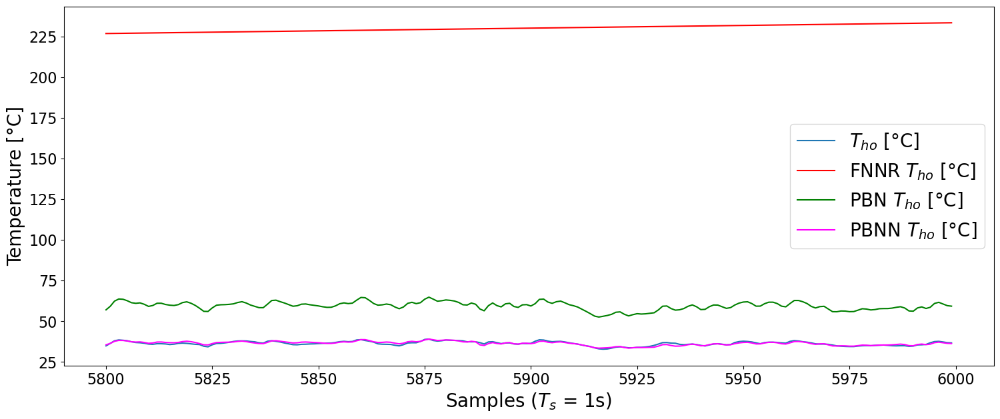

In [117]:
df[-200:]['T_ho [°C]'].plot(label = '$T_{ho}$ [°C]')
df[-200:]['FNNR T_ho [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{ho}$ [°C]')
df[-200:]['PBN T_ho [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{ho}$ [°C]')
df[-200:]['PBNN T_ho [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{ho}$ [°C]')

# Adding labels and legend
# plt.title('$T_{ho}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_ho_comparison_plot_last_200.png')

# Display the plot
plt.show()

### T_ho bias corrected

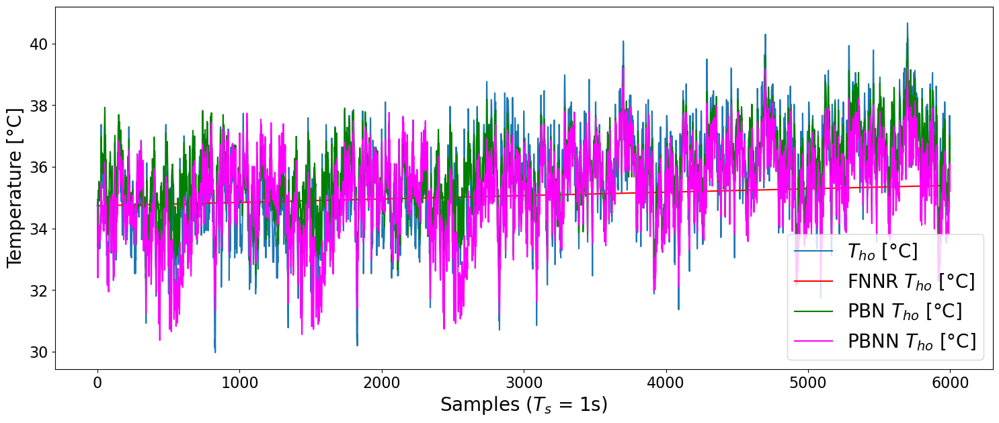

In [118]:
df['T_ho [°C]'].plot(label = '$T_{ho}$ [°C]')
df['FNNR T_ho [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{ho}$ [°C]')
df['PBN T_ho [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{ho}$ [°C]')
df['PBNN T_ho [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{ho}$ [°C]')

# Adding labels and legend
# plt.title('$T_{ho}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_ho_comparison_plot_bias.png')

# Display the plot
plt.show()

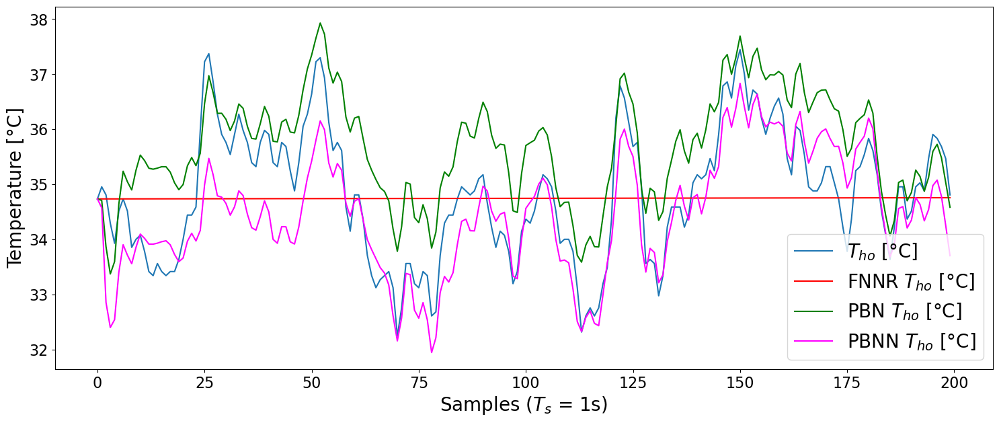

In [119]:
df[:200]['T_ho [°C]'].plot(label = '$T_{ho}$ [°C]')
df[:200]['FNNR T_ho [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{ho}$ [°C]')
df[:200]['PBN T_ho [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{ho}$ [°C]')
df[:200]['PBNN T_ho [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{ho}$ [°C]')

# Adding labels and legend
# plt.title('$T_{ho}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_ho_comparison_plot_bias_first_200.png')

# Display the plot
plt.show()

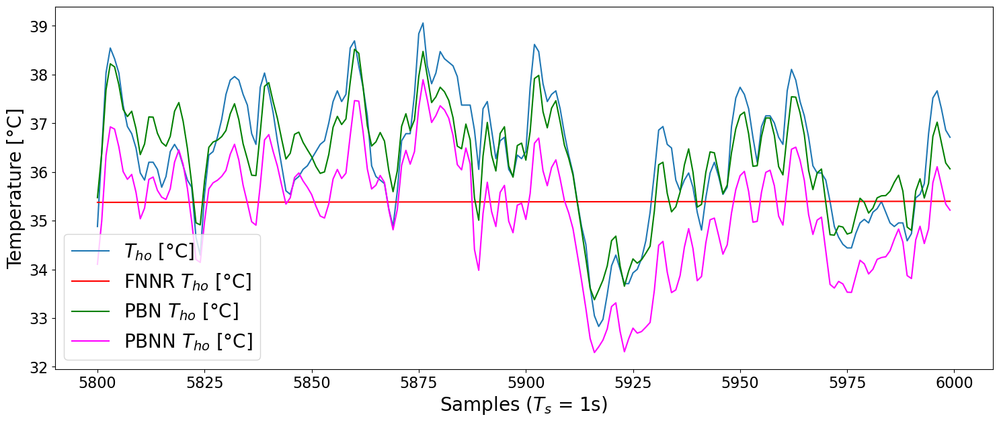

In [120]:
df[-200:]['T_ho [°C]'].plot(label = '$T_{ho}$ [°C]')
df[-200:]['FNNR T_ho [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{ho}$ [°C]')
df[-200:]['PBN T_ho [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{ho}$ [°C]')
df[-200:]['PBNN T_ho [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{ho}$ [°C]')

# Adding labels and legend
# plt.title('$T_{ho}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_ho_comparison_plot_bias_last_200.png')

# Display the plot
plt.show()

### T_co

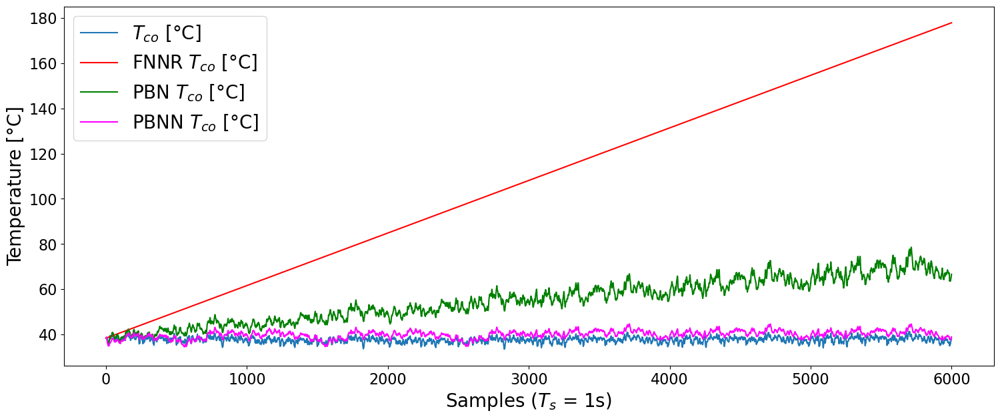

In [121]:
df['T_co [°C]'].plot(label = '$T_{co}$ [°C]')
df['FNNR T_co [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{co}$ [°C]')
df['PBN T_co [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{co}$ [°C]')
df['PBNN T_co [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{co}$ [°C]')

# Adding labels and legend
# plt.title('$T_{co}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_co_comparison_plot.png')

# Display the plot
plt.show()

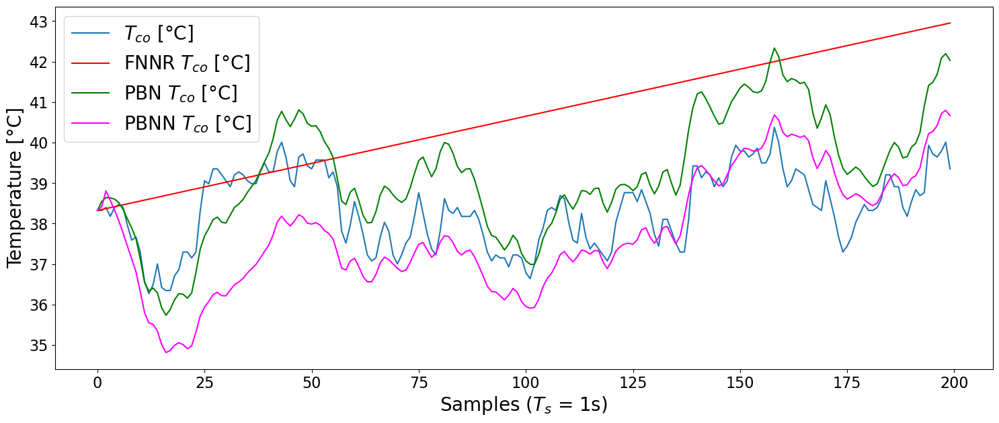

In [122]:
df[:200]['T_co [°C]'].plot(label = '$T_{co}$ [°C]')
df[:200]['FNNR T_co [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{co}$ [°C]')
df[:200]['PBN T_co [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{co}$ [°C]')
df[:200]['PBNN T_co [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{co}$ [°C]')

# Adding labels and legend
# plt.title('$T_{co}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_co_comparison_plot_first_200.png')

# Display the plot
plt.show()

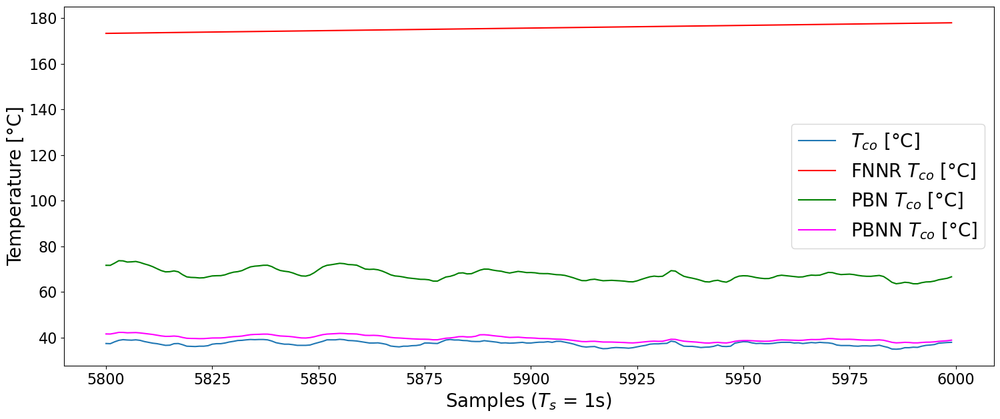

In [123]:
df[-200:]['T_co [°C]'].plot(label = '$T_{co}$ [°C]')
df[-200:]['FNNR T_co [°C]'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{co}$ [°C]')
df[-200:]['PBN T_co [°C]'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{co}$ [°C]')
df[-200:]['PBNN T_co [°C]'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{co}$ [°C]')

# Adding labels and legend
# plt.title('$T_{co}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_co_comparison_plot_last_200.png')

# Display the plot
plt.show()

### T_co bias corrected

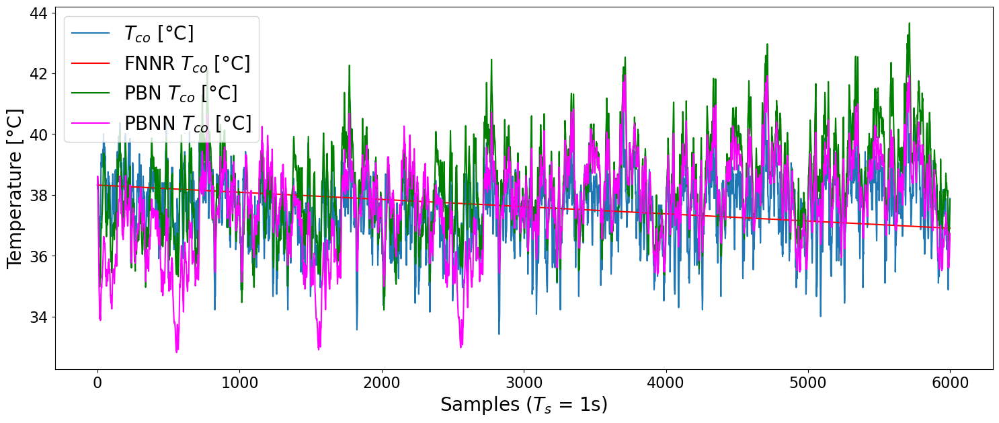

In [124]:
df['T_co [°C]'].plot(label = '$T_{co}$ [°C]')
df['FNNR T_co [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{co}$ [°C]')
df['PBN T_co [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{co}$ [°C]')
df['PBNN T_co [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{co}$ [°C]')

# Adding labels and legend
# plt.title('$T_{co}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_co_comparison_plot_bias.png')

# Display the plot
plt.show()

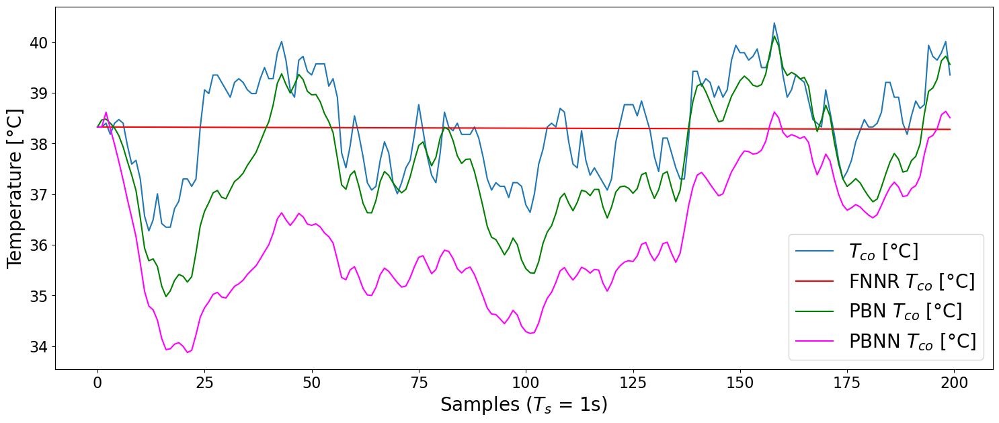

In [125]:
df[:200]['T_co [°C]'].plot(label = '$T_{co}$ [°C]')
df[:200]['FNNR T_co [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{co}$ [°C]')
df[:200]['PBN T_co [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{co}$ [°C]')
df[:200]['PBNN T_co [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{co}$ [°C]')

# Adding labels and legend
# plt.title('$T_{co}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_co_comparison_plot_bias_first_200.png')

# Display the plot
plt.show()

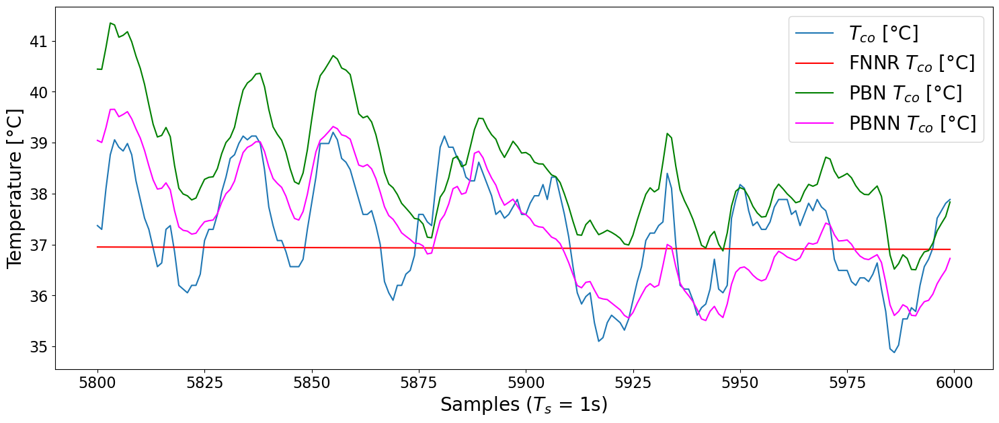

In [126]:
df[-200:]['T_co [°C]'].plot(label = '$T_{co}$ [°C]')
df[-200:]['FNNR T_co [°C] bias corrected'].plot(color = 'red', figsize = [18,7], label = 'FNNR $T_{co}$ [°C]')
df[-200:]['PBN T_co [°C] bias corrected'].plot(color = 'green', figsize = [18,7], label = 'PBN $T_{co}$ [°C]')
df[-200:]['PBNN T_co [°C] bias corrected'].plot(color = 'magenta', figsize = [18,7], label = 'PBNN $T_{co}$ [°C]')

# Adding labels and legend
# plt.title('$T_{co}$ Comparison')
plt.xlabel('Samples ($T_s$ = 1s)', fontsize=20)
plt.ylabel('Temperature [°C]', fontsize=20)
plt.legend(fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the plot as an image file
plt.savefig('figures/T_co_comparison_plot_bias_last_200.png')

# Display the plot
plt.show()